# Credit Card Fraud Detection Pipeline

### Submitted by: Shahar Tavor, 316315464




## Choosing Dataset
---

Anonymized credit card transactions labeled as fraudulent or genuine \
https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud


- I chose the Kaggle credit card fraud dataset as it aligns with Data Science in Cyber by simulating real-world fraud detection, and is a widely used benchmark in anomaly detection.
- The dataset is also large, clean, preprocessed (PCA transformed), and labeled, making it ideal for building & testing a machine learning pipeline.


## System Stage
---


- The dataset was created by Worldline and Université Libre de Bruxelles (ULB) using European credit card transactions from 2013. It was anonymized using PCA to protect sensitive details and released for academic research.

- Released on Kaggle in 2016, primarily for research and model benchmarking.


## Data Governance
---



#### Define the problem:
Design a system to detect fraudulent credit card transactions by identifying them as anomalies hidden within a large volume of legitimate activity.

### Imports:

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score,confusion_matrix
from sklearn.ensemble import RandomForestClassifier
import shap
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.neighbors import LocalOutlierFactor
from sklearn.cluster import KMeans
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from lime.lime_tabular import LimeTabularExplainer
from sklearn.preprocessing import LabelEncoder

from scipy.stats import chi2
from scipy.stats import ttest_ind
from scipy.stats import mannwhitneyu
from scipy.special import rel_entr
from scipy.stats import wasserstein_distance

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)


### Download the Dataset:

1. Create a Kaggle account (if you don’t have one).
2. Visit: https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud
3. *Click Download* to get the `creditcard.csv` file.

To download via code (requires Kaggle API setup):

```bash
!kaggle datasets download -d mlg-ulb/creditcardfraud
!unzip creditcardfraud.zip


## Metadata
---


In [34]:
df = pd.read_csv("creditcard.csv")
print(f"Shape of dataset: {df.shape}")  

Shape of dataset: (284807, 31)


In [35]:
df.head(3)
#may be result of a PCA Dimensionality reduction to protect user identities and sensitive features(v1-v28)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0


In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [37]:
counts = df['Class'].value_counts()
counts

Class
0    284315
1       492
Name: count, dtype: int64

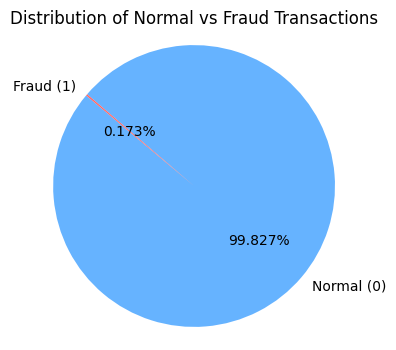

In [38]:
plt.figure(figsize=(4,4))
plt.pie(counts, labels=['Normal (0)', 'Fraud (1)'], autopct='%1.3f%%', startangle=140, colors=['#66b3ff','#ff6666'])
plt.title('Distribution of Normal vs Fraud Transactions')
plt.axis('equal')  # Equal aspect ratio ensures pie is a circle
plt.show()


In [40]:
df.rename(columns={'Class': 'IsFraud'}, inplace=True)

In [ ]:
missing_values = df.isnull().sum()
missing_percent = (missing_values / len(df)) * 100
missing_df = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage': missing_percent
})
print(missing_df[missing_df['Missing Values'] > 0])


No missing data in this df

### Special Values:

In [41]:
print("Has inf:", np.isinf(df.values).any())

# Check for negative amounts
print("Negative transaction amounts:", (df['Amount'] < 0).sum())

Has inf: False
Negative transaction amounts: 0


#### Time column

Number of seconds elapsed between this transaction and the first transaction in the dataset \
 Fraudulent transactions often happen at unusual hours (e.g., late night, early morning)

In [42]:
df['Hour'] = ((df['Time'] // 3600) % 24).astype(int) #  3600 seconds = 1 hour

In [43]:
summary = pd.DataFrame({
    'Data Type': df.dtypes,
    'Missing (%)': df.isnull().mean() * 100,
    'Unique Values': df.nunique(),
})
summary


,Data Type,Missing (%),Unique Values
Time,float64,0.0,124592
V1,float64,0.0,275663
V2,float64,0.0,275663
V3,float64,0.0,275663
V4,float64,0.0,275663
V5,float64,0.0,275663
V6,float64,0.0,275663
V7,float64,0.0,275663
V8,float64,0.0,275663
V9,float64,0.0,275663


## Statistics
---


In [44]:
df.describe().T[['mean', 'std', 'min', 'max']]

,mean,std,min,max
Time,9.481386e+04,47488.145955,0.000000,172792.000000
V1,1.168375e-15,1.958696,-56.407510,2.454930
V2,3.416908e-16,1.651309,-72.715728,22.057729
V3,-1.379537e-15,1.516255,-48.325589,9.382558
V4,2.074095e-15,1.415869,-5.683171,16.875344
V5,9.604066e-16,1.380247,-113.743307,34.801666
V6,1.487313e-15,1.332271,-26.160506,73.301626
V7,-5.556467e-16,1.237094,-43.557242,120.589494
V8,1.213481e-16,1.194353,-73.216718,20.007208
V9,-2.406331e-15,1.098632,-13.434066,15.594995


### Check for correlations between variables

In [45]:
corr_matrix = df.corr(numeric_only=True)

Uses Pandas default, which is: `method='pearson'`.\
This computes the **Pearson correlation** coefficient, which measures **linear correlation** — how well a straight line can describe the relationship between two variables.

#### Between all variables:

In [46]:
corr_pairs = corr_matrix.abs().unstack().sort_values(ascending=False)
# Remove self-correlations
corr_pairs = corr_pairs[corr_pairs < 1]
top_corr_df = corr_pairs.head(15).reset_index()
top_corr_df.columns = ['Feature 1', 'Feature 2', 'Correlation']
top_corr_df

,Feature 1,Feature 2,Correlation
0,Amount,V2,0.531409
1,V2,Amount,0.531409
2,V3,Time,0.419618
3,Time,V3,0.419618
4,Time,Hour,0.415575
5,Hour,Time,0.415575
6,V7,Amount,0.397311
7,Amount,V7,0.397311
8,Amount,V5,0.386356
9,V5,Amount,0.386356


- The strongest feature correlations were found between `V2` and `Amount` (0.53), and between `Time` with `V3` and `Hour` (~0.42), indicating moderate redundancy among certain features.

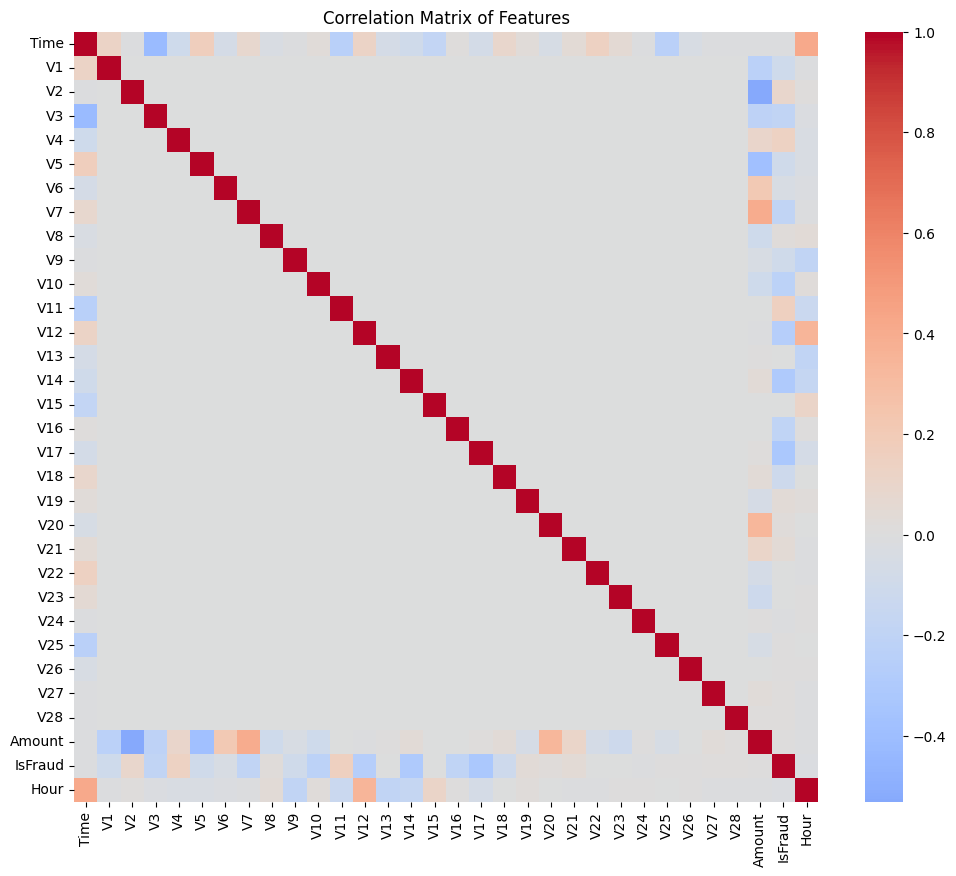

In [47]:
plt.figure(figsize=(12,10))
sns.heatmap(corr_matrix, cmap='coolwarm', center=0)
plt.title("Correlation Matrix of Features")
plt.show()


#### With fraud:

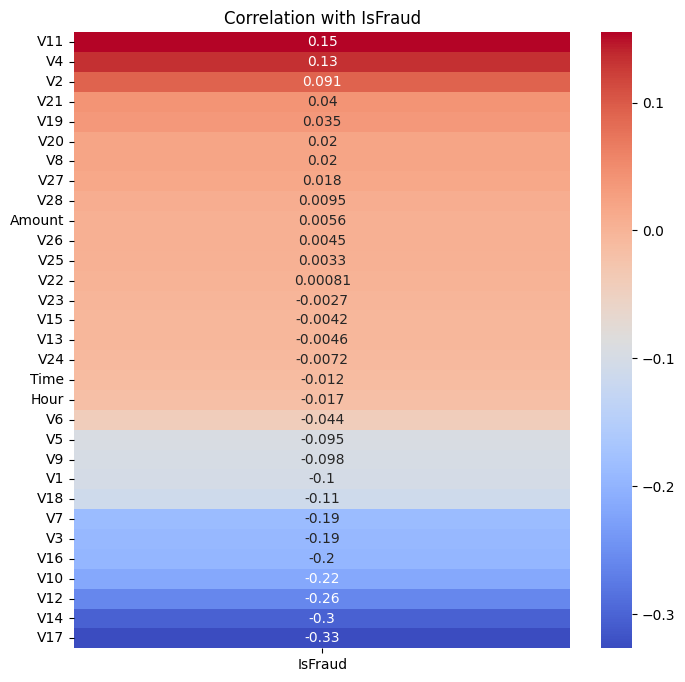

In [48]:
plt.figure(figsize=(8, 8))
corr_with_fraud = corr_matrix['IsFraud'].drop('IsFraud').sort_values(ascending=False)
sns.heatmap(corr_with_fraud.to_frame(), annot=True, cmap='coolwarm')
plt.title("Correlation with IsFraud")
plt.show()

In [49]:
print("Top 5 correlations with IsFraud:")
top5_corr_with_fraud=corr_with_fraud.head(5)
print(top5_corr_with_fraud)

Top 5 correlations with IsFraud:
V11    0.154876
V4     0.133447
V2     0.091289
V21    0.040413
V19    0.034783
Name: IsFraud, dtype: float64


In [50]:
def show_distribution_top5(var_name):
    plt.figure(figsize=(6,4))
    sns.kdeplot(data=df, x=var_name, hue='IsFraud', common_norm=False, fill=True, alpha=0.5)
    plt.title(f"Distribution of {var_name} by Fraud Label")
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()


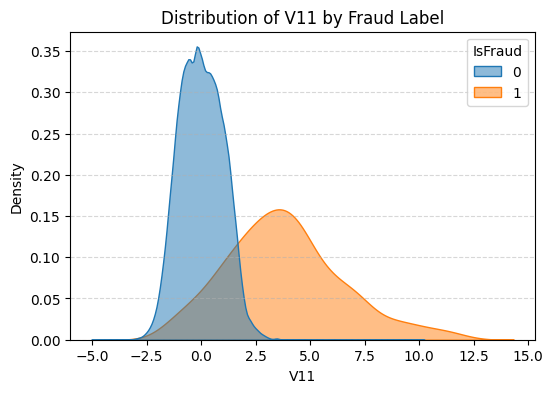

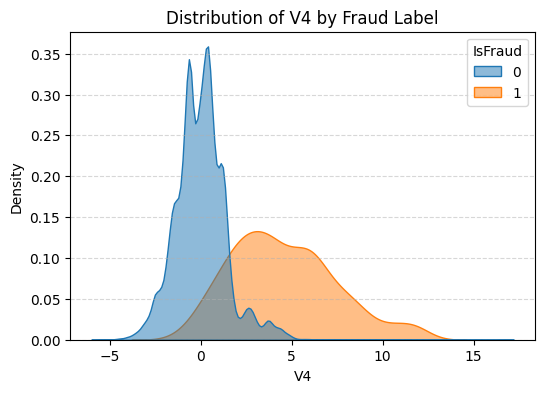

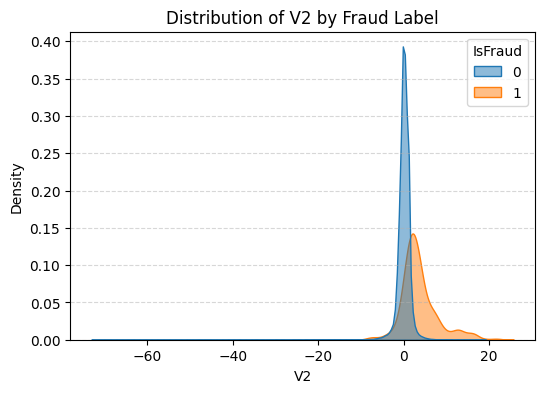

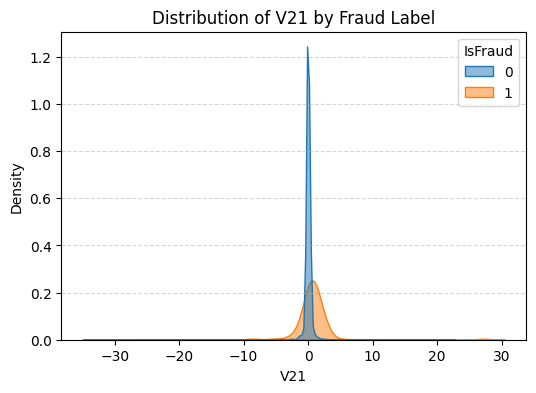

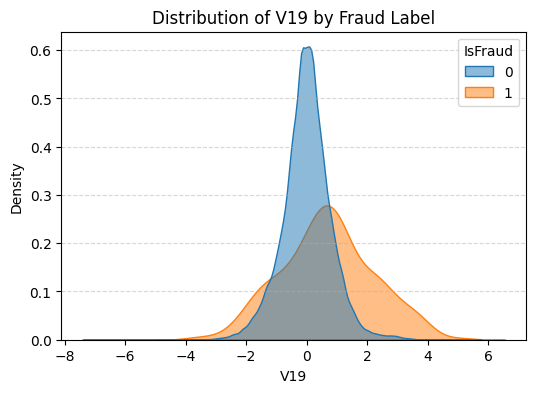

In [51]:
for var_name in top5_corr_with_fraud.index:
    show_distribution_top5(var_name)

Although V11 exhibits only a modest linear correlation (r = 0.15) with fraud, its distribution is distinctly shifted for fraudulent transactions. Fraud cases predominantly occur at higher V11 values, indicating that V11 could serve as a valuable predictor in a non-linear classifier.

In [52]:
high_corr_pairs = (
    corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    .stack()
    .reset_index()
    .rename(columns={'level_0': 'Feature1', 'level_1': 'Feature2', 0: 'Correlation'})
)

high_corr_pairs = high_corr_pairs[high_corr_pairs['Correlation'] > 0.8]

print(high_corr_pairs)


Empty DataFrame
Columns: [Feature1, Feature2, Correlation]
Index: []


Because the features V1–V28 are PCA components, they are already orthogonalized (uncorrelated) by construction.

### Check duplications:

In [56]:
duplicates = df[df.duplicated(keep=False)]
print(duplicates['IsFraud'].value_counts())

IsFraud
0    1822
1      32
Name: count, dtype: int64


Duplicate records (∼1,800) were mostly non-fraudulent and were removed to avoid bias and improve data quality.

In [57]:
print("Duplications: ",df.duplicated().sum())
df.drop_duplicates(inplace=True)
print("Duplications: ",df.duplicated().sum())

Duplications:  1081
Duplications:  0


### Missing Values:

In [504]:
constant_cols = [col for col in df.columns if df[col].nunique() == 1]
print("Constant columns:", constant_cols)


Constant columns: []


## Anomaly Detection
---


### 1-D anomaly detection

In [505]:
named_columns = ['Time', 'Amount' , 'Hour']
pca_columns = [f'V{i}' for i in range(1,29)] 

In [506]:
def plot_fraud_rate_comparison(column, k=3,method="std"):
    print("Method: ",method)
    if method == "std":
        mean = df[column].mean()
        std = df[column].std()
        anomalies = ((df[column] < mean - k*std) | (df[column] > mean + k*std))
        
    elif method == "iqr":
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - k * IQR
        upper = Q3 + k * IQR
        anomalies = ((df[column] < lower) | (df[column] > upper))
        
    else:
        M =  df[column].median()
        MAD = np.median(np.abs(df[column] - M))
        lower = M - 3*MAD
        upper = M + 3*MAD
        anomalies = ((df[column] < lower) | (df[column] > upper))
        
    fraud_rate_anomalies = df.loc[anomalies, 'IsFraud'].mean()
    fraud_rate_normal = df.loc[~anomalies, 'IsFraud'].mean()    
    plt.figure(figsize=(5,4))
    plt.bar(['Anomalies', 'Normal'], [fraud_rate_anomalies, fraud_rate_normal],
            color=['red', 'green'], alpha=0.7)
    plt.ylabel("Fraud Rate")
    plt.title(f"Fraud Rate in {column} anomalies vs normal")
    plt.ylim(0, max(fraud_rate_anomalies, fraud_rate_normal)*1.5)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()
    
    print(f"{column}:\n Fraud rate among anomalies: {fraud_rate_anomalies:.4%}\n Fraud rate among normal: {fraud_rate_normal:.4%}")


In [507]:
def detect_anomalies_1d(columns, k=3, method="std"):
    summary = []

    for column in columns:
        print("Method: ",method)

        if method == "std":
            mean = df[column].mean()
            std = df[column].std()
            lower = mean - (k * std)
            upper = mean + (k * std)
            anomalies = ((df[column] < mean - k*std) | (df[column] > mean + k*std))
            count = anomalies.sum()

            summary.append({
            'Feature': column,
            'Mean': round(mean, 2),
            'Std': round(std, 2),
            f'{k} STD Lower': round(lower, 2),
            f'{k} STD Upper': round(upper, 2),
            'Anomalies': int(count)
        })
            
        elif method == "iqr":
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower = Q1 - k * IQR
            upper = Q3 + k * IQR
            anomalies = ((df[column] < lower) | (df[column] > upper))
            count = anomalies.sum()

            summary.append({
            'Feature': column,
            'Q1': round(Q1, 2),
            'Q3': round(Q3, 2),
            'IQR': round(IQR, 2),
            f'{k} IQR Lower': round(lower, 2),
            f'{k} IQR Upper': round(upper, 2),
            'Anomalies': int(count),
          
        })
            
        else:
            M =  df[column].median()
            MAD = np.median(np.abs(df[column] - M))
            lower = M - 3*MAD
            upper = M + 3*MAD
            anomalies = ((df[column] < lower) | (df[column] > upper))
            count = anomalies.sum()
            
            summary.append({
            'Feature': column,
            'Median': round(M, 2),
            'MAD': round(MAD, 2),
            f'{k} Lower': round(lower, 2),
            f'{k} Upper': round(upper, 2),
            'Anomalies': int(count),
          
        })

        print(f"\n{column}: {count} anomalies found")
        print(df.loc[anomalies, [column, 'IsFraud']].head())

    return pd.DataFrame(summary).sort_values(by='Anomalies', ascending=False)



#### 3-std from mean:

**$p$ is an anomaly** if  
$p < \mu - 3 \cdot \sigma$  
or  
$p > \mu + 3 \cdot \sigma$

In [508]:
std_anomalies_named = detect_anomalies_1d(named_columns,method="std")

Method:  std

Time: 0 anomalies found
Empty DataFrame
Columns: [Time, IsFraud]
Index: []
Method:  std

Amount: 4063 anomalies found
      Amount  IsFraud
51   1402.95        0
89   1142.02        0
140   919.60        0
150   937.69        0
164  3828.04        0
Method:  std

Hour: 0 anomalies found
Empty DataFrame
Columns: [Hour, IsFraud]
Index: []


- `Time`: No anomalies detected, as all transaction times fall well within ±3 std.
- `Hour`: No anomalies detected, since hours (0–23) are tightly bounded within ±3 std.
- `Amount`: Detected 4,063 anomalies (~1.4%) as unusually large transactions (> \$839.67). \
Amount variable is highly right-skewed, with most transactions clustered under 100 and rare transactions exceeding 25,000. This makes standard deviation-based anomaly detection less meaningful, and suggests using robust methods like IQR or MAD.


In [509]:
std_anomalies_pca = detect_anomalies_1d(pca_columns)
std_anomalies_pca.sort_values(by='Anomalies', ascending=False, inplace=True)

Method:  std

V1: 3647 anomalies found
             V1  IsFraud
164   -6.093248        0
290   -5.852465        0
1158  -6.169664        0
1632 -11.140706        0
2178  -5.849226        0
Method:  std

V2: 4303 anomalies found
            V2  IsFraud
18   -5.450148        0
164 -12.114213        0
210  -5.931717        0
249  -5.081215        0
290   5.267376        0
Method:  std

V3: 1953 anomalies found
             V3  IsFraud
164   -5.694973        0
1632 -12.389545        0
5966  -4.797899        0
5980  -5.261730        0
6331  -6.240697        1
Method:  std

V4: 3101 anomalies found
            V4  IsFraud
83   -4.515824        0
351  -4.434211        0
608  -4.657545        0
858   4.861129        0
1632  6.013346        0
Method:  std

V5: 2913 anomalies found
            V5  IsFraud
51   -6.631951        0
140  -5.517758        0
210   7.672544        0
450   6.044486        0
1022  4.615393        0
Method:  std

V6: 4638 anomalies found
           V6  IsFraud
51   5.1221

In [510]:
std_anomalies_pca.head(5)

,Feature,Mean,Std,3 STD Lower,3 STD Upper,Anomalies
26,V27,0.0,0.40,-1.19,1.19,4775
5,V6,-0.0,1.33,-4.00,3.99,4638
19,V20,0.0,0.77,-2.31,2.31,4594
1,V2,-0.0,1.65,-4.94,4.94,4303
7,V8,-0.0,1.18,-3.54,3.54,4205


**Amount - 3std summary:**

We can see that `V27` has the highest number of anomalies (4,775), which stands out significantly.\

Method:  std


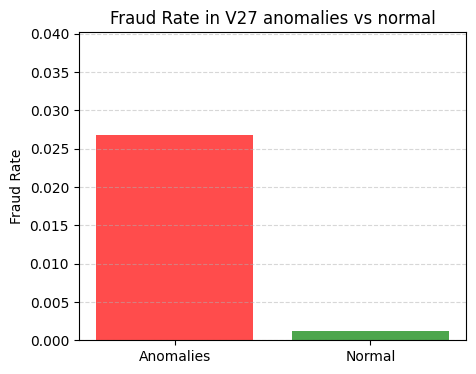

V27:
 Fraud rate among anomalies: 2.6806%
 Fraud rate among normal: 0.1237%
Method:  std


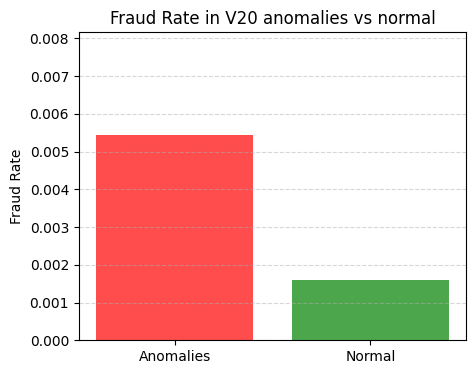

V20:
 Fraud rate among anomalies: 0.5442%
 Fraud rate among normal: 0.1605%
Method:  std


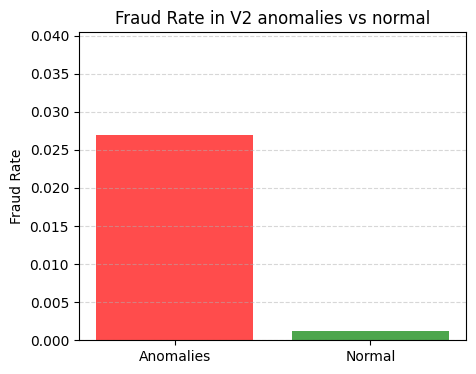

V2:
 Fraud rate among anomalies: 2.6958%
 Fraud rate among normal: 0.1278%
Method:  std


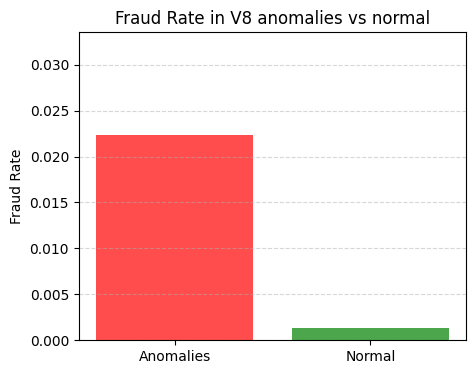

V8:
 Fraud rate among anomalies: 2.2354%
 Fraud rate among normal: 0.1356%


In [511]:
for col in ['V27', 'V20', 'V2','V8']:
    plot_fraud_rate_comparison(col)

**Fraud rates among 3 std anomalies**
- `V27`: 2.68% vs 0.12% (≈22× higher)
- `V2`:  2.70% vs 0.13% (≈21× higher)
- `V20`: 0.54% vs 0.16% (≈3× higher)

This highlights that extreme values in these PCA features are strongly associated with fraud.


#### IQR:

$IQR = Q3 - Q1$

**p is Anomaly** if \
$p<Q1−3⋅IQR$\
or\
$p>Q3+3⋅IQR$

In [512]:
detect_anomalies_1d(named_columns,method="iqr")

Method:  iqr

Time: 0 anomalies found
Empty DataFrame
Columns: [Time, IsFraud]
Index: []
Method:  iqr

Amount: 18802 anomalies found
      Amount  IsFraud
2     378.66        0
51   1402.95        0
89   1142.02        0
134   552.18        0
140   919.60        0
Method:  iqr

Hour: 0 anomalies found
Empty DataFrame
Columns: [Hour, IsFraud]
Index: []


,Feature,Q1,Q3,IQR,3 IQR Lower,3 IQR Upper,Anomalies
1,Amount,5.60,77.51,71.91,-210.13,293.24,18802
0,Time,54204.75,139298.00,85093.25,-201075.00,394577.75,0
2,Hour,10.00,19.00,9.00,-17.00,46.00,0


Method:  iqr


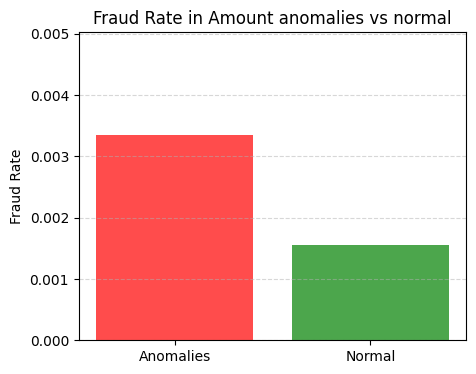

Amount:
 Fraud rate among anomalies: 0.3351%
 Fraud rate among normal: 0.1548%


In [513]:
plot_fraud_rate_comparison("Amount",method="iqr")

**Amount - 3iqr summary:**

Using IQR to flag large transactions (> ~$293) roughly doubles the fraud rate compared to normal spending, indicating higher risk. \
However, many large transactions are legitimate, so it is a weak standalone anomaly feature."

In [514]:
iqr_anomalies_pca = detect_anomalies_1d(pca_columns,method="iqr")

Method:  iqr

V1: 1949 anomalies found
             V1  IsFraud
1632 -11.140706        0
2464 -12.168192        0
2792 -10.780565        0
4235  -7.955978        0
4608  -7.896534        0
Method:  iqr

V2: 4430 anomalies found
            V2  IsFraud
18   -5.450148        0
164 -12.114213        0
210  -5.931717        0
249  -5.081215        0
290   5.267376        0
Method:  iqr

V3: 738 anomalies found
             V3  IsFraud
1632 -12.389545        0
6641  -7.423894        1
6719  -6.891438        1
6899  -7.653616        1
6903  -7.618463        1
Method:  iqr

V4: 469 anomalies found
            V4  IsFraud
1632  6.013346        0
6331  6.675732        1
6334  6.348557        1
6336  6.078266        1
6338  6.047445        1
Method:  iqr

V5: 2280 anomalies found
            V5  IsFraud
51   -6.631951        0
140  -5.517758        0
210   7.672544        0
450   6.044486        0
1022  4.615393        0
Method:  iqr

V6: 5415 anomalies found
           V6  IsFraud
51   5.122103

In [515]:
iqr_anomalies_pca.head(5)

,Feature,Q1,Q3,IQR,3 IQR Lower,3 IQR Upper,Anomalies
26,V27,-0.07,0.09,0.16,-0.56,0.58,16271
19,V20,-0.21,0.13,0.34,-1.25,1.17,13251
27,V28,-0.05,0.08,0.13,-0.45,0.47,12399
7,V8,-0.21,0.33,0.53,-1.81,1.93,11163
22,V23,-0.16,0.15,0.31,-1.09,1.08,8109


Method:  iqr


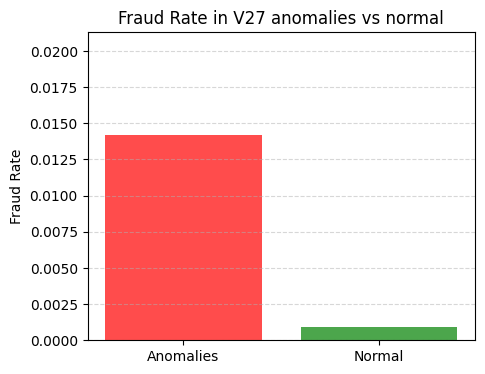

V27:
 Fraud rate among anomalies: 1.4197%
 Fraud rate among normal: 0.0905%
Method:  iqr


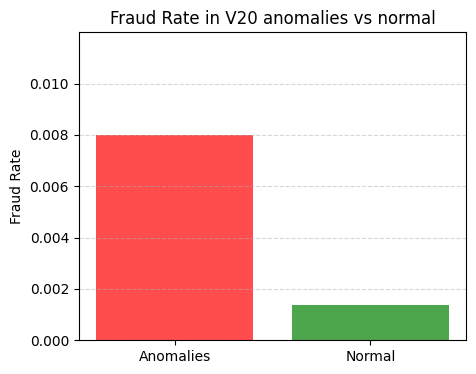

V20:
 Fraud rate among anomalies: 0.7999%
 Fraud rate among normal: 0.1357%
Method:  iqr


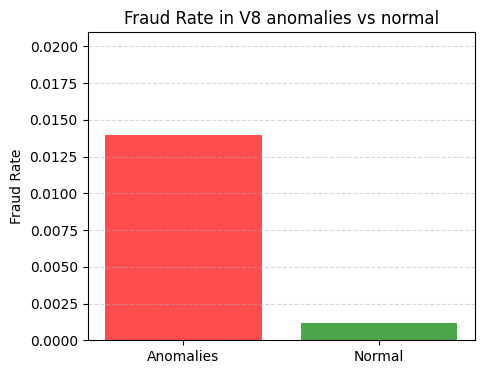

V8:
 Fraud rate among anomalies: 1.3975%
 Fraud rate among normal: 0.1163%


In [516]:
columns = ["V27","V20","V8"]
for col in columns:
    plot_fraud_rate_comparison(col,method="iqr")

***IQR anomalies on PCA features***
- `V27`: Fraud rate among anomalies = **1.42%**, vs normal = **0.09%** (~16× higher)
- `V20`: Fraud rate among anomalies = **0.80%**, vs normal = **0.14%** (~6× higher)
- `V8`:  Fraud rate among anomalies = **1.40%**, vs normal = **0.12%** (~12× higher)

This confirms that anomalies detected by the IQR method on these PCA features are **significantly more likely to be fraudulent**, reinforcing their importance in spotting suspicious behavior.


#### MAD:
$M =$ median, $MAD =$ median absolute deviation  
$p$ is an anomaly if  
$p < M - 3 \cdot MAD$  
or  
$p > M + 3 \cdot MAD$

In [517]:
detect_anomalies_1d(named_columns,method="mad")

Method:  mad

Time: 0 anomalies found
Empty DataFrame
Columns: [Time, IsFraud]
Index: []
Method:  mad

Amount: 67237 anomalies found
    Amount  IsFraud
0   149.62        0
2   378.66        0
3   123.50        0
8    93.20        0
12  121.50        0
Method:  mad

Hour: 15163 anomalies found
   Hour  IsFraud
0     0        0
1     0        0
2     0        0
3     0        0
4     0        0


,Feature,Median,MAD,3 Lower,3 Upper,Anomalies
1,Amount,22.0,20.22,-38.66,82.66,67237
2,Hour,15.0,4.00,3.00,27.00,15163
0,Time,84692.5,42654.50,-43271.00,212656.00,0


Method:  mad


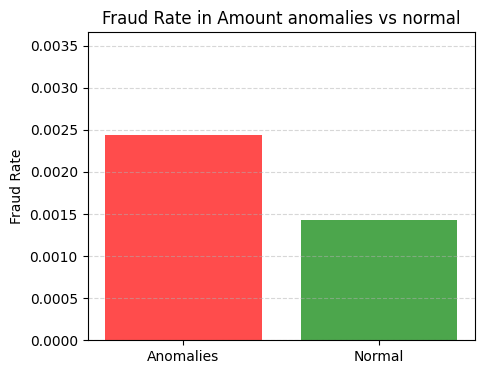

Amount:
 Fraud rate among anomalies: 0.2439%
 Fraud rate among normal: 0.1427%


In [518]:
plot_fraud_rate_comparison("Amount",method="mad")

Using 3 MAD on Amount, transactions above ~$83 were flagged as anomalies, showing a modest fraud rate increase (0.24% vs 0.14%).

In [519]:
mad_anomalies_pca = detect_anomalies_1d(pca_columns,method="mad")

Method:  mad

V1: 9768 anomalies found
           V1  IsFraud
18  -5.401258        0
85  -4.575093        0
130 -3.591826        0
139 -4.257597        0
140 -5.101877        0
Method:  mad

V2: 22550 anomalies found
          V2  IsFraud
18 -5.450148        0
41  2.198527        0
82  2.600138        0
85 -4.429184        0
89 -4.146007        0
Method:  mad

V3: 11810 anomalies found
           V3  IsFraud
85   3.402585        0
116  3.562770        0
140 -3.458034        0
161  3.350717        0
164 -5.694973        0
Method:  mad

V4: 26565 anomalies found
          V4  IsFraud
13  2.712520        0
51  3.710061        0
62  2.598192        0
67  2.813750        0
83 -4.515824        0
Method:  mad

V5: 25529 anomalies found
          V5  IsFraud
8   2.669599        0
11  2.924584        0
18  3.049106        0
24  2.941968        0
51 -6.631951        0
Method:  mad

V6: 34102 anomalies found
          V6  IsFraud
2   1.800499        0
8   3.721818        0
11  3.317027        0
2

In [520]:
mad_anomalies_pca.head(5)

,Feature,Median,MAD,3 Lower,3 Upper,Anomalies
26,V27,0.00,0.08,-0.23,0.24,62340
27,V28,0.01,0.07,-0.18,0.21,46645
19,V20,-0.06,0.17,-0.57,0.44,42022
7,V8,0.02,0.26,-0.75,0.80,41886
5,V6,-0.28,0.56,-1.95,1.40,34102


Method:  mad


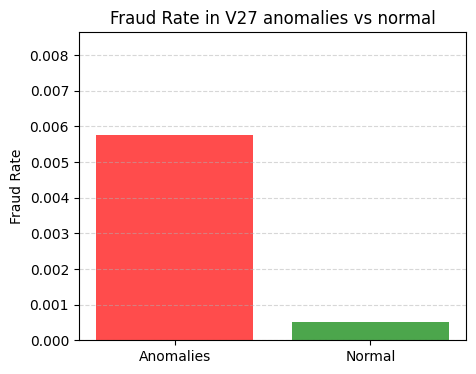

V27:
 Fraud rate among anomalies: 0.5759%
 Fraud rate among normal: 0.0515%
Method:  mad


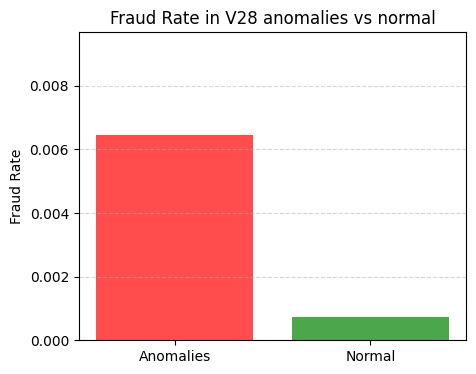

V28:
 Fraud rate among anomalies: 0.6453%
 Fraud rate among normal: 0.0725%
Method:  mad


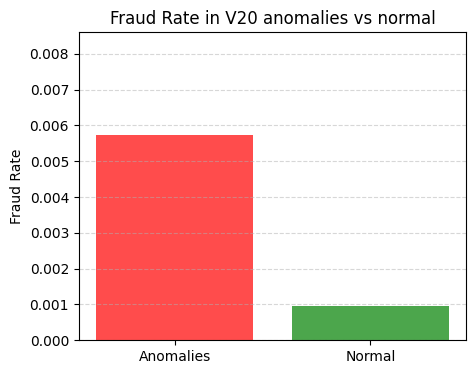

V20:
 Fraud rate among anomalies: 0.5735%
 Fraud rate among normal: 0.0960%
Method:  mad


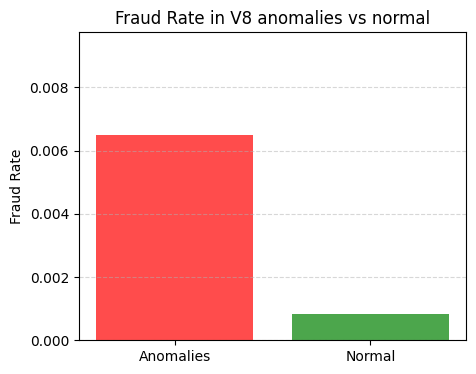

V8:
 Fraud rate among anomalies: 0.6494%
 Fraud rate among normal: 0.0831%
Method:  mad


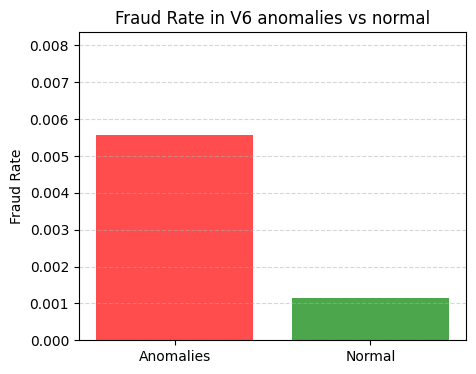

V6:
 Fraud rate among anomalies: 0.5572%
 Fraud rate among normal: 0.1134%


In [521]:
top_mad = mad_anomalies_pca["Feature"].head(5).unique()
for col in top_mad:
    plot_fraud_rate_comparison(col,method="mad")

3 MAD analysis shows that anomalies in `V27`, `V28`, `V20`, `V8`, and `V6` are 6–12× more likely to be fraudulent than normal values, confirming these components as key fraud indicators.

### 1-D anomaly detection summary

- Across all methods (3 STD, 3 IQR, 3 MAD), transactions flagged as anomalies had a significantly higher fraud rate.\
This aligns with the intuition that fraud often manifests as unusual behavior in the data distribution.

- The same PCA features repeatedly stood out:

1. `V27` was always the top feature (most anomalies across all three methods).

2. `V20` and `V8` also consistently ranked high.

3. `V6` and `V28` appeared prominently in at least two of the three methods.

- For the named columns:
1. **Amount** showed many anomalies (especially under IQR & MAD), capturing somewhat higher fraud rates, though less dramatic than the PCA components.
2. Time and Hour did not yield meaningful anomalies, indicating temporal patterns were less useful for this 1-D approach.

Fraud rate comparison by anomaly method

| Feature | Method | Fraud rate (anomalies) | Fraud rate (normal) | Lift |
|---------|--------|------------------------|---------------------|------|
| **V27** | **STD**    | 2.68%              | 0.12%               | ~22× |
|         | IQR    | 1.42%            | 0.09%                  | ~16× |
|         | MAD    | 0.58%              | 0.05%               | ~11× |
| **V20** | STD    | 0.54%              | 0.16%               | ~3×  |
|         | **IQR**    | 0.80%              | 0.14%               | ~6×  |
|         | **MAD**    | 0.57%              | 0.10%               | ~6×  |
| **V8**  | **STD**    | 2.24%              | 0.14%               | ~16× |
|         | IQR    | 1.40%              | 0.12%               | ~12× |
|         | MAD    | 0.65%              | 0.08%               | ~8×  |


- Across all methods (STD, IQR, MAD), anomalies in `V27`, `V20`, and `V8` consistently show higher fraud rates.

- `V27` remains the strongest signal, with fraud rates in anomalies up to 22× higher under STD.

- `V8` also shows sharp increases (up to 16×), while `V20` still captures a clear pattern, though less dramatic (around 3–6×).

### Multi-dimensional anomaly

To detect anomalies in multiple dimensions, we use the **Mahalanobis distance**, which measures how far a point is from the center of the data while accounting for correlations between features.
Given:
- Mean vector: $μ$
- Covariance matrix: $Σ$

The distance of a point $x$ is computed as:

$$
D_M(x) = \sqrt{(x - \mu)^T \Sigma^{-1} (x - \mu)}$$

Points with a high Mahalanobis distance lie outside the typical data distribution.

In 2D, the set of points with equal Mahalanobis distance forms an **ellipse**, inside which data is considered normal.\
Points outside this ellipse can be flagged as **potential anomalies**.


**Lift** quantifies how much more concentrated fraud is among anomalies compared to the entire dataset. It is calculated as:

$$
\text{Lift} = \frac{\text{Fraud rate among anomalies}}{\text{Overall fraud rate}}
$$

A higher lift indicates that fraud is significantly more likely within the set of flagged anomalies, demonstrating the effectiveness of the anomaly detection method.


In [522]:
def mahalanobis_distance(x, mu, inv_covmat):
    x_mu = x - mu
    return np.sqrt(np.dot(np.dot(x_mu, inv_covmat), x_mu.T))

In [523]:
from scipy.stats import chi2
import numpy as np

def mahalanobis_distance(x, mu, inv_covmat):
    x_mu = x - mu
    return np.sqrt(np.dot(np.dot(x_mu, inv_covmat), x_mu.T))

def evaluate_feature_pair(df, features, name):
    data_2d = df[features]
    mu = data_2d.mean().values
    cov = np.cov(data_2d.values, rowvar=False)
    inv_covmat = np.linalg.inv(cov)

    md = data_2d.apply(lambda row: mahalanobis_distance(row.values, mu, inv_covmat), axis=1)

    # Use 95% quantile
    threshold = np.sqrt(chi2.ppf(0.95, df=2))
    anomalies = md > threshold

    total_anomalies = anomalies.sum()
    total_frauds_in_anomalies = df['IsFraud'][anomalies].sum()
    fraud_rate_anomalies = df['IsFraud'][anomalies].mean()
    overall_fraud_rate = df['IsFraud'].mean()
    lift = fraud_rate_anomalies / overall_fraud_rate

    print(f"{name}:")
    print(f"  - Anomalies detected: {total_anomalies}")
    print(f"  - Frauds among anomalies: {total_frauds_in_anomalies}")
    print(f"  - Fraud rate among anomalies: {fraud_rate_anomalies:.2%}")
    print(f"  - Lift over baseline: {lift:.1f}×")
    print()

# Now run on your two feature pairs
evaluate_feature_pair(df, ['V27', 'V20'], "V27 + V20")
evaluate_feature_pair(df, ['V14', 'V12'], "V14 + V12")


V27 + V20:
  - Anomalies detected: 12765
  - Frauds among anomalies: 183
  - Fraud rate among anomalies: 1.43%
  - Lift over baseline: 8.6×

V14 + V12:
  - Anomalies detected: 20717
  - Frauds among anomalies: 417
  - Fraud rate among anomalies: 2.01%
  - Lift over baseline: 12.1×



In [524]:
def plot_mahalanobis_distance(value1, value2):
    data_2d = df[[value1, value2]]
    mu = data_2d.mean().values
    cov = np.cov(data_2d.values, rowvar=False)
    inv_covmat = np.linalg.inv(cov)
    
    md = data_2d.apply(lambda row: mahalanobis_distance(row.values, mu, inv_covmat), axis=1)
    
    # Set threshold (95% quantile)
    threshold = np.sqrt(chi2.ppf(0.95, df=2))
    anomalies = md > threshold
    
    # Plot
    plt.figure(figsize=(8,6))
    plt.scatter(data_2d[value1], data_2d[value2], c='lightblue', s=10, label='Data')
    plt.scatter(data_2d[value1][anomalies], data_2d[value2][anomalies], 
                color='red', s=10, label='Anomalies (95%)')
    plt.xlabel(value1)
    plt.ylabel(value2)
    plt.title(f'Mahalanobis Distance Ellipse for {value1} vs {value2}')
    plt.legend()
    plt.show()
    
    # Compute fraud metrics
    total_anomalies = anomalies.sum()
    total_frauds_in_anomalies = df['IsFraud'][anomalies].sum()
    fraud_rate_anomalies = df['IsFraud'][anomalies].mean()
    overall_fraud_rate = df['IsFraud'].mean()
    lift = fraud_rate_anomalies / overall_fraud_rate
    
    # Print stats
    print(f"{value1} + {value2}:")
    print(f"  - Anomalies detected: {total_anomalies}")
    print(f"  - Frauds among anomalies: {total_frauds_in_anomalies}")
    print(f"  - Fraud rate among anomalies: {fraud_rate_anomalies:.2%}")
    print(f"  - Lift over baseline: {lift:.1f}×")


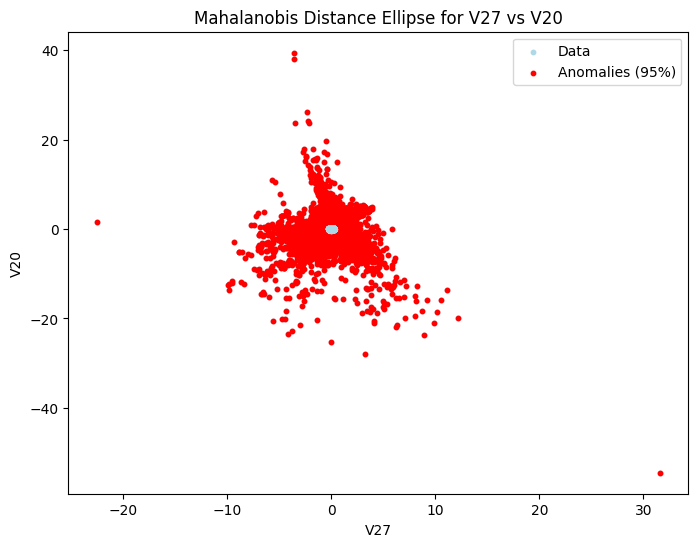

V27 + V20:
  - Anomalies detected: 12765
  - Frauds among anomalies: 183
  - Fraud rate among anomalies: 1.43%
  - Lift over baseline: 8.6×


In [525]:
plot_mahalanobis_distance('V27','V20')

- Using Mahalanobis distance on `V27` and `V20` flagged a large proportion of transactions as anomalies.\
This aligns with our earlier 1D findings, but also shows the heavy-tailed distribution may push many points beyond the typical ellipse

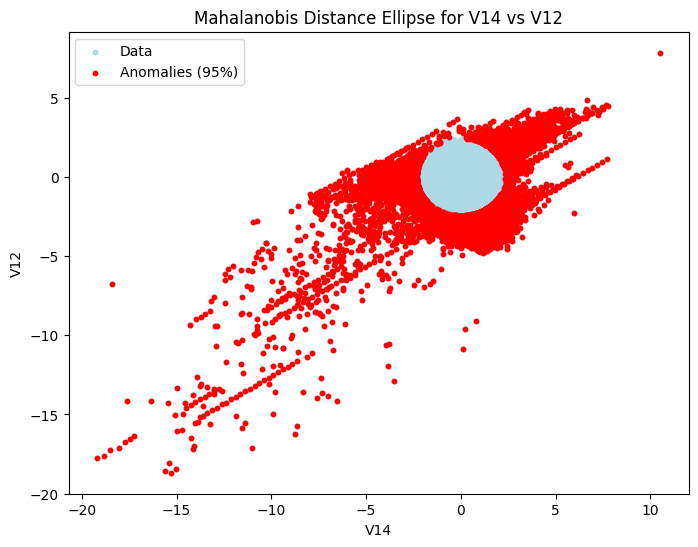

V14 + V12:
  - Anomalies detected: 20717
  - Frauds among anomalies: 417
  - Fraud rate among anomalies: 2.01%
  - Lift over baseline: 12.1×


In [526]:
plot_mahalanobis_distance('V14','V12')

The Mahalanobis distance plot for `V14` vs `V12` shows a tight central cluster of typical transactions, with many points scattered outside the expected 95% ellipse. 
This indicates that unusual combinations of `V14` and `V12` values are relatively common and may represent potential anomalies worth further investigation.


In [527]:
def print_anomalies_examples(model_anomalies, count):
    idx_fp = np.where((model_anomalies == 1) & (y == 0))[0]  # False Positives
    idx_tp = np.where((model_anomalies == 1) & (y == 1))[0]  # True Positives
    
    for i in range(count):
        print(f"\n=== Example {i+1} ===")
        
        # Handle False Positive
        if i < len(idx_fp):
            print("Anomaly flagged but actually normal (False Positive):")
            print(X.iloc[idx_fp[i]][["Amount", "Hour"]])
        else:
            print("No more false positives available.")
        
        # Handle True Positive
        if i < len(idx_tp):
            print("Anomaly flagged and actually fraud (True Positive):")
            print(X.iloc[idx_tp[i]][["Amount", "Hour"]])
        else:
            print("No more true positives available.")


#### Isolation Forest
- Builds random trees by:
  - Randomly selecting a feature.
  - Randomly picking a split value uniformly between the min and max of that feature in the current data subset.
  - Recursively partitioning the data.
- **Anomalies get isolated faster (short path lengths)** because they differ sharply from the bulk of the data.
- Computes an anomaly score from the average path length across all trees — shorter paths indicate higher likelihood of being an anomaly.

In [528]:
X = df.drop(columns=['IsFraud','Time'])
y = df['IsFraud']

- Isolation Forest **works best on continuous or ordinal features** (like PCA components and `Amount`) and though `Time` is ordinal, here it’s just elapsed seconds unrelated to fraud, so it’s excluded to avoid noise.

In [529]:
iso_forest = IsolationForest(n_estimators=100, contamination='auto', random_state=42)
iso_forest.fit(X)

IF_scores = iso_forest.decision_function(X)  # anomaly score: higher = more normal
#IF_Score: the normalized average path length turned into an anomaly score.
IF_anomalies = (iso_forest.predict(X) == -1).astype(int)  # 1 = anomaly, 0 = normal
print("\nClassification Report:")
print(classification_report(y, IF_anomalies, digits=4))


Classification Report:
              precision    recall  f1-score   support

           0     0.9997    0.9616    0.9803    283253
           1     0.0340    0.8097    0.0653       473

    accuracy                         0.9614    283726
   macro avg     0.5168    0.8857    0.5228    283726
weighted avg     0.9981    0.9614    0.9787    283726



1. *High* recall on frauds-the model finds ~80% of actual frauds.
2. *Very high* precision on normal transactions,almost all (99%) transactions it calls “normal” truly are.
3. *Very low* precision on flagged frauds (0.034), when it flags a transaction as fraud (anomaly), it’s usually a false alarm.

In [530]:
fraud_rate_normal = y[IF_anomalies == 0].mean()
fraud_rate_anomaly = y[IF_anomalies == 1].mean()
fraud_rate_real = y.mean()

print(f"Actual overall fraud rate in data: {fraud_rate_real:.4%}")
print(f"Fraud rate among normal IF: {fraud_rate_normal:.4%}")
print(f"Fraud rate among anomalies IF: {fraud_rate_anomaly:.4%}")


Actual overall fraud rate in data: 0.1667%
Fraud rate among normal IF: 0.0330%
Fraud rate among anomalies IF: 3.4026%


In [531]:
iso_forest = IsolationForest(n_estimators=100, contamination=fraud_rate_real, random_state=42)
iso_forest.fit(X)

IF_scores = iso_forest.decision_function(X)  # anomaly score: higher = more normal
#IF_Score: the normalized average path length turned into an anomaly score.
IF_anomalies = (iso_forest.predict(X) == -1).astype(int)  # 1 = anomaly, 0 = normal
print("\nClassification Report:")
print(classification_report(y, IF_anomalies, digits=4))


Classification Report:
              precision    recall  f1-score   support

           0     0.9987    0.9987    0.9987    283253
           1     0.2199    0.2199    0.2199       473

    accuracy                         0.9974    283726
   macro avg     0.6093    0.6093    0.6093    283726
weighted avg     0.9974    0.9974    0.9974    283726



- By setting contamination=fraud_rate, the model flags far fewer transactions, **boosting precision to ~22% (fewer false positives)** \
but dropping **recall to ~22% (missing more frauds)**, trading broad detection for higher confidence in flagged cases.

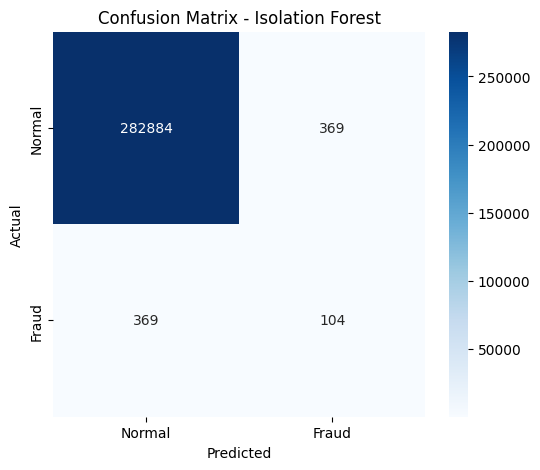

In [532]:
cm = confusion_matrix(y, IF_anomalies)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Normal', 'Fraud'],
            yticklabels=['Normal', 'Fraud'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Isolation Forest')
plt.show()



In [533]:
print_anomalies_examples(IF_anomalies,count=1)


=== Example 1 ===
Anomaly flagged but actually normal (False Positive):
Amount    7712.43
Hour         0.00
Name: 1632, dtype: float64
Anomaly flagged and actually fraud (True Positive):
Amount    1.0
Hour      3.0
Name: 8296, dtype: float64


1. **False positive**-  A large legitimate transaction at midnight flagged as anomalous due to unusual time + high amount
2. **True positive**- A small transaction at 3AM, likely a fraudster testing if the card is active.
- Examining individual anomalies shows the model effectively highlights suspicious patterns — catching both high-value transactions at odd hours and typical fraud tests with small amounts late at night. 


#### One-Class SVM for Anomaly Detection
-  Learn the “normal region” in the feature space, then flag anything outside it as an anomaly.
- How it works:
1. Fits a boundary around the majority of the data (assumed to be normal).
2. Uses a kernel function (like RBF) to capture non-linear patterns.
3. Points *far from the learned region* get classified as outliers.

`nu`- the fraction of data points to lie outside the boundary.\
(Example if nu=0.01, it will try to ensure at most 1% of the data is flagged as anomalies)\
Smaller nu → tighter boundary, more points classified as normal.\
Larger nu → wider boundary, more points allowed inside, fewer classified as anomalies

In [534]:
df_sample = df.sample(n=20000, random_state=42) 
X_sample = df_sample.drop(columns=['IsFraud','Time'])
y_sample = df_sample["IsFraud"]

In [535]:
nu_values = [0.005, 0.01, 0.05, 0.1]
for nu in nu_values:
    print(f"Using nu={nu}")
    ocsvm = OneClassSVM(nu=nu, kernel='rbf', gamma='scale')
    ocsvm.fit(X_sample)
    
    # Predict (-1 is anomaly, set by nu, 1 is normal)
    ocsvm_preds = ocsvm.predict(X_sample)
    ocsvm_anomalies = np.where(ocsvm_preds == -1, 1, 0)
    
    # Calculate fraud rates
    fraud_rate_anomaly = y_sample[ocsvm_anomalies == 1].mean()
    fraud_rate_normal = y_sample[ocsvm_anomalies == 0].mean()
    
    print(f"Fraud rate among anomalies: {fraud_rate_anomaly:.4%}")
    print(f"Fraud rate among normal: {fraud_rate_normal:.4%}\n")


Using nu=0.005
Fraud rate among anomalies: 7.8431%
Fraud rate among normal: 0.1307%

Using nu=0.01
Fraud rate among anomalies: 5.0251%
Fraud rate among normal: 0.1212%

Using nu=0.05
Fraud rate among anomalies: 1.5968%
Fraud rate among normal: 0.0947%

Using nu=0.1
Fraud rate among anomalies: 0.8504%
Fraud rate among normal: 0.0944%



- **nu=0.005** works best here because it flags only the most extreme outliers, so the fraud concentration is highest.

#### Local Outlier Factor (LOF)
- LOF is an unsupervised anomaly detection algorithm that detects outliers by comparing local density.
- Instead of a global boundary (like SVM or Isolation Forest), it looks at the local neighborhood of each point.
  
It measures: 
1. How close you are to your k nearest neighbors.
2. How close your neighbors are to their neighbors.
3. If your density is much lower than that of your neighbors (you’re in a sparse region, while neighbors are in dense cluster), you’re an outlier.

- by default, the distance in sklearn’s LocalOutlierFactor is **Euclidean.**


In [536]:
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.0017)
lof_preds = lof.fit_predict(X)  # -1 is anomaly, 1 is normal
lof_anomalies = np.where(lof_preds == -1, 1, 0)

# Evaluate fraud concentration
fraud_rate_anomaly = y[lof_anomalies == 1].mean()
fraud_rate_normal = y[lof_anomalies == 0].mean()

print(f"Fraud rate among anomalies: {fraud_rate_anomaly:.4%}")
print(f"Fraud rate among normal: {fraud_rate_normal:.4%}")


Fraud rate among anomalies: 11.1801%
Fraud rate among normal: 0.1479%


- LOF flagged a small group of transactions where fraud is ~11%, hugely boosting concentration vs the normal ~0.15%, showing it’s excellent at finding local outliers.

In [537]:
print_anomalies_examples(lof_anomalies,count=2)


=== Example 1 ===
Anomaly flagged but actually normal (False Positive):
Amount    2.0
Hour      0.0
Name: 460, dtype: float64
Anomaly flagged and actually fraud (True Positive):
Amount    59.0
Hour       1.0
Name: 6108, dtype: float64

=== Example 2 ===
Anomaly flagged but actually normal (False Positive):
Amount    0.68
Hour      0.00
Name: 495, dtype: float64
Anomaly flagged and actually fraud (True Positive):
Amount    766.36
Hour        4.00
Name: 10630, dtype: float64


- LOF effectively focuses on **transactions occurring at unusual hours**, picking up both very small and large amounts in low-density time windows. 
-  False positives tend to be harmless small transactions at night, while true positives show that frauds often exploit these same temporal patterns.


### Multi-dimensional anomaly summary

| Method             | Fraud rate anomalies | Fraud rate normal | Overall fraud rate |
|---------------------|----------------------|-------------------|--------------------|
| Isolation Forest (`cont≈0.0017`) | ~22%          | ~0.13%         | ~0.17% |
| One-Class SVM (`nu=0.005`)       | ~7.8%          | ~0.13%         | ~0.17% |
| Local Outlier Factor           | ~11.2%        | ~0.15%        | ~0.17% |

- All methods dramatically increase the concentration of frauds in flagged anomalies vs the baseline ~0.17%.
- The normal transactions remain close to the natural fraud rate.


## Clustering
---


In [539]:
X = df.drop(columns=['IsFraud','Time'])

### K-mean

In [540]:
# Fit K-Means
kmeans = KMeans(n_clusters=4, random_state=42)
cluster_labels = kmeans.fit_predict(X)

# Create DataFrame for easy analysis
cluster_df = pd.concat(
    [X.reset_index(drop=True), 
     pd.DataFrame({
         "Cluster": cluster_labels,
         "Fraud": y.reset_index(drop=True)
     })],
    axis=1
)

# Check cluster sizes and fraud rates
summary = cluster_df.groupby("Cluster").agg(
    Transactions=('Fraud', 'count'),
    FraudRate=('Fraud', 'mean'),
    AvgAmount=('Amount', 'mean'),
).reset_index()

print(summary)


   Cluster  Transactions  FraudRate    AvgAmount
0        0        257963   0.001531    38.966111
1        1          3425   0.003212  1366.769095
2        2         22012   0.003044   407.398655
3        3           326   0.000000  4298.599110


In [541]:
def scatter_cluster_by_col(columns):
    fig, axs = plt.subplots(1, len(columns), figsize=(4 * len(columns), 4))

    if len(columns) == 1:
        axs = [axs]
    
    for ax, col in zip(axs, columns):
        sns.stripplot(
            x="Cluster", y=col, data=cluster_df, 
            ax=ax, jitter=True, alpha=0.5,hue="Cluster",legend=False,
            palette="tab10"
        )
            
    plt.suptitle("Scatter of features by Cluster")
    plt.tight_layout()
    plt.show()


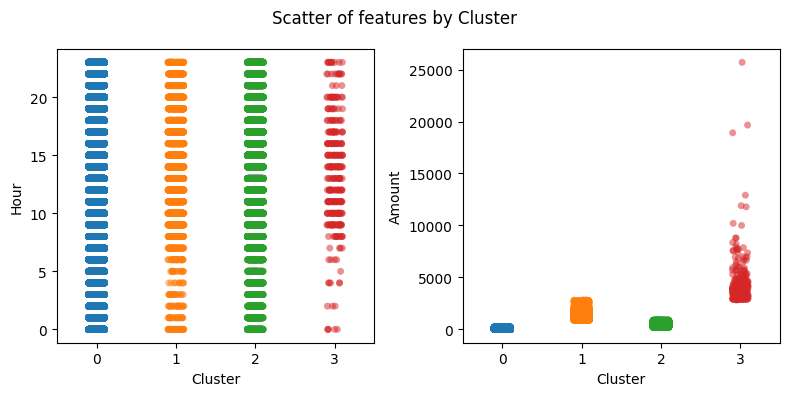

In [542]:
scatter_cluster_by_col(["Hour","Amount"])

- **Hour** not informative — spread uniformly across clusters. No cluster seems tied to specific hours.
- **Amount** very clear separation: cluster 3 has larger transactions, cluster 0 very small transactions, with 1 & 2 in between. Strong indicator that K-Means is mostly grouping by transaction size.


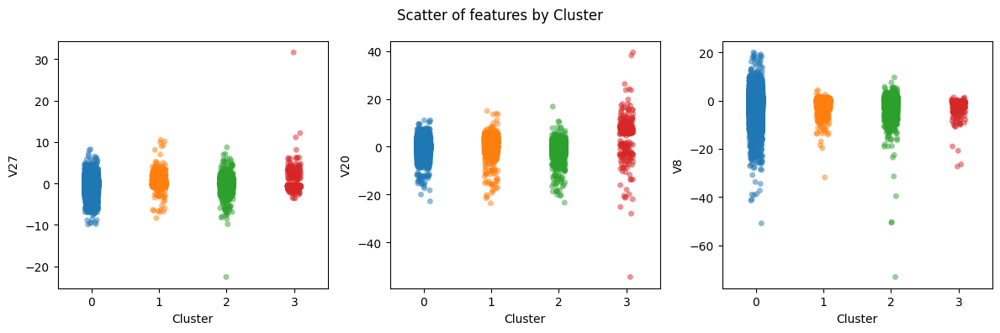

In [543]:
scatter_cluster_by_col(["V27","V20","V8"])

**Cluster separation on key anomaly features**
- The scatter plots show that `V27`, `V20`, `V8` — previously identified as the most informative features in 1-D anomaly detection — also exhibit clear separation across clusters in K-Means.

## Segments
---


### Segmentation by Hour

In [544]:
def fraud_by_hour(df,isFraud=True):
    if isFraud: 
        label,color = "Fraudulent","red"
        df_filter = df[df['IsFraud'] == 1]
    else:
        label,color = "Non-Fraudulent","green"
        df_filter = df[df['IsFraud'] == 0]
    
    plt.figure(figsize=(6, 4))
    sns.countplot(data=df_filter, x='Hour', color=color)
    plt.title(f"{label} Transactions by Hour", fontsize=14)
    plt.xlabel("Hour of Day (0–23)", fontsize=12)
    plt.ylabel(f"Number of {label} Transactions", fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


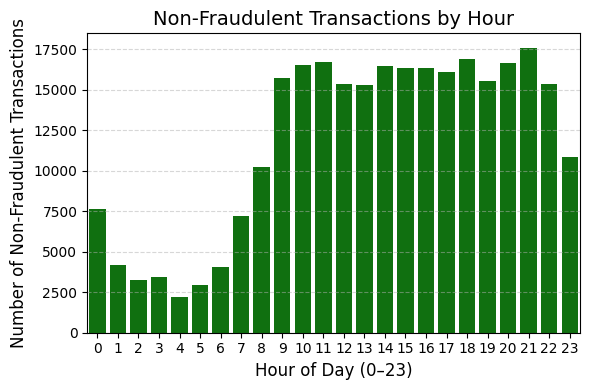

In [545]:
fraud_by_hour(df,isFraud=False)

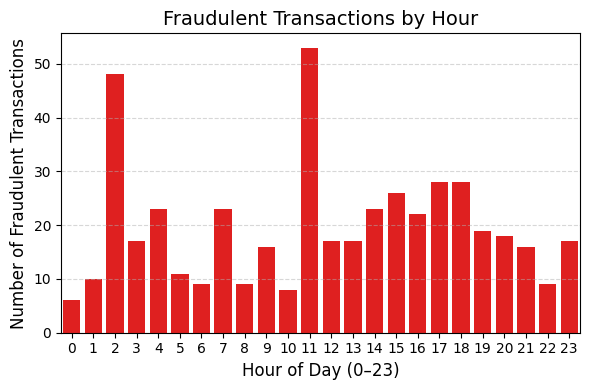

In [546]:
fraud_by_hour(df,isFraud=True)

**2AM spike** — likely automated malware activiy \
**11AM spike** - likely social engineering fraud with human call

In [61]:
hour_fraud_rate = df.groupby('Hour')['IsFraud'].mean()
hour_fraud_rate.sort_values(ascending=False)

Hour
2     0.014510
4     0.010436
3     0.004875
5     0.003681
7     0.003180
11    0.003158
1     0.002376
6     0.002205
17    0.001736
18    0.001651
15    0.001588
23    0.001562
14    0.001392
16    0.001342
19    0.001221
13    0.001109
12    0.001105
20    0.001078
9     0.001015
21    0.000908
8     0.000880
0     0.000785
22    0.000585
10    0.000483
Name: IsFraud, dtype: float64

In [548]:
def hour_segment(hour):
    if hour == 2:
        return 'night_peak_2am'  # highest observed
    elif hour == 4:
        return 'early_4am'       # moderate elevation
    elif hour in [3,5]:
        return 'late_night'      # mild elevation
    else:
        return 'daytime'         # baseline

df['HourSegment'] = df['Hour'].apply(hour_segment)
print(df.groupby('HourSegment')['IsFraud'].mean().sort_values(ascending=False))


HourSegment
night_peak_2am    0.014510
early_4am         0.010436
late_night        0.004324
daytime           0.001376
Name: IsFraud, dtype: float64


Based on our calculated fraud rates per hour:

- **2 AM (1.45%)** — the highest by far, indicating likely automated fraud attacks.
- **4 AM (1.04%)** — moderately elevated, suggesting opportunistic or automated activity.
- **3 AM & 5 AM (~0.4-0.5%)** — mild elevation above the general baseline.
- **All other hours (~0.1%)** — baseline levels, typical of normal daily activity.

Created a new `HourSegment` feature with four categories:
- `night_peak_2am` (2 AM)
- `early_4am` (4 AM)
- `late_night` (3 AM & 5 AM)
- `daytime` (all other hours)

This segmentation is directly informed by observed fraud rates,
allowing us to capture clear temporal fraud patterns and integrate them effectively into our model.



In [549]:
high_risk = df[df['HourSegment'] == 'night_peak_2am']['Amount']
low_risk = df[df['HourSegment'] == 'daytime']['Amount']


### Comparison between segments based on amount

#### t-test
Tests if the means of two groups are significantly different, assuming roughly normal distributions.

**Formula:**
$
t = \frac{\bar{x}_1 - \bar{x}_2}{\sqrt{\frac{s_1^2}{n_1} + \frac{s_2^2}{n_2}}}
$
- $\bar{x}_1, \bar{x}_2$: means of groups 1 and 2
- $s_1^2, s_2^2$: variances
- $n_1, n_2$: sample sizes

*Interpretation:*
If the p-value is < 0.05, we reject the null hypothesis and conclude the means are significantly different.

$\bar{x}_1$ =  mean Amount in NightPeak2AM segment\
$\bar{x}_2$ =  mean Amount in Daytime segment

In [550]:
# Run t-test
t_stat, p_value = ttest_ind(high_risk, low_risk, equal_var=False)
print(f"t-statistic = {t_stat:.3f}, p-value = {p_value:.5f}")


t-statistic = -2.912, p-value = 0.00362


- Since p < 0.05, we conclude the average transaction amount at 2AM differs significantly from low-risk hours, highlighting a distinct fraud pattern.

#### Mann-Whitney U
A non-parametric test comparing the ranks of two groups, useful when distributions are not normal. 

**Statistic U:**\
$
U = R - \frac{n(n+1)}{2}
$
- $R$: sum of ranks for one group
- $n$: sample size of that group

*Interpretation:*
Tests if the medians (or overall distributions) differ without assuming normality.

In [551]:
u_stat, p_val = mannwhitneyu(high_risk, low_risk, alternative='two-sided')
print(f"Mann-Whitney U={u_stat:.3f}, p-value={p_val:.3f}")

Mann-Whitney U=405667958.500, p-value=0.000


- Since p < 0.05, we conclude the transaction amount distributions at 2AM vs low-risk hours differ significantly, indicating distinct behavioral patterns

#### Kullback-Leibler Divergence (KL Divergence)
Measures how one probability distribution diverges from another.

**Formula:**
$
D_{KL}(P || Q) = \sum_i P(i) \log \frac{P(i)}{Q(i)}
$

*Interpretation:*
If KL is 0, distributions are identical. Larger values mean more divergence.  
Asymmetric: $ D_{KL}(P||Q) \neq D_{KL}(Q||P) $.

In [552]:
def kl_divergence(p, q):
    return np.sum(rel_entr(p, q))

In [553]:
p_hist, _ = np.histogram(high_risk, bins=30, range=(0,300), density=True)
q_hist, _ = np.histogram(low_risk, bins=30, range=(0,300), density=True)

p_hist /= p_hist.sum()
q_hist /= q_hist.sum()

kl = np.sum(rel_entr(p_hist, q_hist))
print(f"KL Divergence = {kl:.5f}")

KL Divergence = 0.03628


- KL Divergence = 0.036 shows the transaction amount distributions at 2AM vs low-risk hours differ modestly in shape, reflecting a subtle shift in spending behavior.


####  Earth Mover’s Distance (EMD)
Also called **Wasserstein distance**, quantifies the "work" needed to transform one distribution into another.

**Formal expression:**
$
W(P, Q) = \int_{-\infty}^{\infty} |F_P(x) - F_Q(x)| \, dx
$

where $F_P, F_Q$ are the cumulative distribution functions.

*Interpretation:*
Gives an intuitive measure of distributional difference in the original units (e.g. transaction amount).

In [554]:
emd = wasserstein_distance(high_risk, low_risk)
print(f"Earth Mover's Distance (Wasserstein) = {emd:.3f}")

Earth Mover's Distance (Wasserstein) = 27.583


- The Earth Mover’s Distance = 27.58 means on average, you’d need to “shift” 27.6 units of transaction amount to turn the 2AM amount distribution into the low-risk distribution.
This indicates a substantial difference in transaction behaviors between these segments.

### Segmentation by Amount

In [555]:
def fraud_by_amount(df, isFraud=True):
    if isFraud: 
        label,color = "Fraudulent","red"
        df_filter = df[df['IsFraud'] == 1]
    else:
        label,color = "Non-Fraudulent","green"
        df_filter = df[df['IsFraud'] == 0]
        
    amounts = df_filter['Amount']
    print(f"\n{label} Transactions - Amount Statistics")
    print(f"Min:  {amounts.min():.2f}")
    print(f"Max:  {amounts.max():.2f}")
    print(f"Mean: {amounts.mean():.2f}")
    print(f"Std:  {amounts.std():.2f}")

    bins = 10 if isFraud else 100  # more bins for non-fraud
    plt.figure(figsize=(6, 4))
    sns.histplot(amounts, bins=bins, color=color, edgecolor="white", alpha=0.7)
    plt.title(f"{label} Transaction Amount Distribution", fontsize=14)
    plt.xlabel("Amount ($)", fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.xlim(0, 2000) 
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()



Non-Fraudulent Transactions - Amount Statistics
Min:  0.00
Max:  25691.16
Mean: 88.41
Std:  250.38


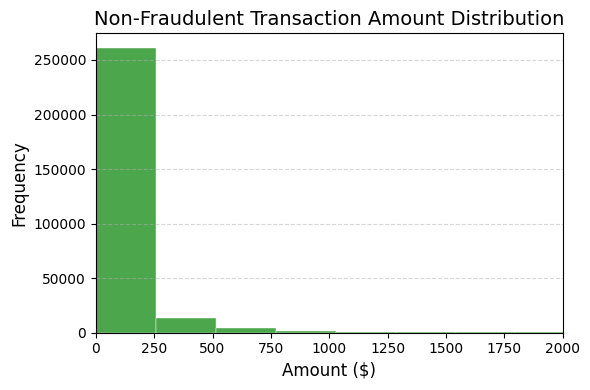

In [556]:
fraud_by_amount(df,isFraud=False)


Fraudulent Transactions - Amount Statistics
Min:  0.00
Max:  2125.87
Mean: 123.87
Std:  260.21


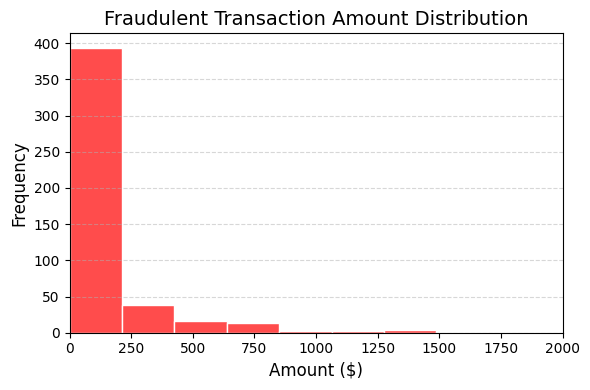

In [557]:
fraud_by_amount(df,isFraud=True)

- Most fraud still happens under ~$250, but there are relatively more medium-sized fraud transactions than non-fraud.



In [558]:
df['AmountSegment'] = pd.qcut(
    df['Amount'], 
    q=4, 
    labels=['low_amount', 'medium_amount', 'high_amount', 'very_high_amount']
)
print(df.groupby('AmountSegment')['IsFraud'].mean().sort_values(ascending=False))


AmountSegment
low_amount          0.003003
very_high_amount    0.002368
medium_amount       0.000662
high_amount         0.000635
Name: IsFraud, dtype: float64


Based on our calculated fraud rates per transaction amount bin:

- **low_amount (0.30%)** — noticeably elevated, indicating many frauds happen on small transactions, likely to test stolen cards.
- **medium_amount (0.07%)** — drops closer to typical levels, suggesting mostly normal behavior.
- **high_amount (0.06%)** — stays low, showing fraudsters often avoid moderately large transactions that could trigger alarms.
- **very_high_amount (0.24%)** — climbs again, pointing to targeted high-value fraud attempts.

Created a new `AmountSegment` feature with four categories:

- `low_amount`
- `medium_amount`
- `high_amount`
- `very_high_amount`

This shows that fraud is more common at the **extremes** — very small amounts (testing cards) and very large amounts (cash-outs) — while mid-sized transactions are generally safer.


### Combined segmenets

In [559]:
df['RiskSegment'] = df['HourSegment'].astype(str) + "_" + df['AmountSegment'].astype(str)
fraud_rates = df.groupby('RiskSegment')['IsFraud'].mean()
print(fraud_rates.sort_values(ascending=False))

RiskSegment
early_4am_low_amount               0.041322
night_peak_2am_low_amount          0.032115
late_night_low_amount              0.016220
night_peak_2am_very_high_amount    0.013841
early_4am_very_high_amount         0.011962
night_peak_2am_high_amount         0.007684
night_peak_2am_medium_amount       0.004367
late_night_very_high_amount        0.003209
early_4am_medium_amount            0.002217
daytime_very_high_amount           0.002203
daytime_low_amount                 0.002139
early_4am_high_amount              0.001919
late_night_high_amount             0.000799
daytime_medium_amount              0.000603
daytime_high_amount                0.000528
late_night_medium_amount           0.000348
Name: IsFraud, dtype: float64


By combining `TimeSegment` and `AmountSegment` into `RiskSegment`,
we get a much sharper view of joint fraud risk:

- `early_4am_low_amount` **(4 AM + low amounts): 4.1% fraud rate**
- `night_peak_2am_low_amount` **(2 AM + low amounts): 3.2% fraud rate**
- Other elevated segments include:
  - `late_night_low_amount` (3 & 5 AM + low amounts): 1.6%
  - `night_peak_2am_very_high_amount` (2 AM + very high amounts): 1.4%

In contrast, most `daytime` segments have fraud rates well below 0.3%,
highlighting how fraud concentrates at specific times and transaction sizes.

This confirms that fraudsters often:
- make **small transactions during suspicious hours**, likely to test stolen cards,
- or attempt **large payouts in off-hours**, hoping to evade detection.


## Models
---


### Running models

In [560]:
X = df.drop('IsFraud', axis=1)
y = df['IsFraud']

In [561]:
# Create encoders
le_time = LabelEncoder()
le_amount = LabelEncoder()
le_risk = LabelEncoder()

# Fit and transform
X['HourSegment'] = le_time.fit_transform(df['HourSegment'])
X['AmountSegment'] = le_amount.fit_transform(df['AmountSegment'])
X['RiskSegment'] = le_risk.fit_transform(df['RiskSegment'])

In [562]:
X['HourSegment'].value_counts()

HourSegment
0    271739
2      6475
3      3308
1      2204
Name: count, dtype: int64

In [563]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)
print("X train shape:",X_train.shape)
print("y train values:",y_train.value_counts())
print()
print("X test shape:",X_test.shape)
print("y test values:",y_test.value_counts())

X train shape: (198608, 34)
y train values: IsFraud
0    198277
1       331
Name: count, dtype: int64

X test shape: (85118, 34)
y test values: IsFraud
0    84976
1      142
Name: count, dtype: int64


In [564]:
def report_results(title, y_pred, y_proba, y_test):
    print(f"\n{title} Results:")
    print(classification_report(y_test, y_pred))
    print(f"ROC AUC: {roc_auc_score(y_test, y_proba):.4f}")

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(4,3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f"{title} - Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    plt.show()

In [565]:
def run_model(model_name, X_train, X_test, y_train):
    
    #StandardScaler z = (x - mean) / std
    if model_name == "Logistic Regression":
        scaler = StandardScaler()
        X_train_scaled = X_train.copy()
        X_test_scaled = X_test.copy()
        X_train_scaled[['Amount', 'Time']] = scaler.fit_transform(X_train[['Amount', 'Time']])
        # fit only on train, fit on test can create data leakage 
        X_test_scaled[['Amount', 'Time']] = scaler.transform(X_test[['Amount', 'Time']])
        X_train_used, X_test_used = X_train_scaled, X_test_scaled
    else:
        X_train_used, X_test_used = X_train, X_test

    # Select model
    if model_name == "Logistic Regression":
        model = LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)
        
    elif model_name == "Random Forest":
        model = RandomForestClassifier(
            n_estimators=100,
            class_weight='balanced',
            random_state=42,
            n_jobs=-1
        )
    elif model_name == "Ada Boost":
        model = AdaBoostClassifier(
            n_estimators=100,
            algorithm='SAMME',
            random_state=42
        )
    else:  # XGBoost
        model = XGBClassifier(
            eval_metric='logloss',
            scale_pos_weight=(len(y_train) - sum(y_train)) / sum(y_train),
            random_state=42
        )
    
    print(f"Running {model}...")
    model.fit(X_train_used, y_train)
    y_pred = model.predict(X_test_used)
    y_proba = model.predict_proba(X_test_used)[:, 1]
    
    return model, y_pred, y_proba


#### Logistic Regression:

In [566]:
lg,y_pred_logics,y_proba_logics = run_model("Logistic Regression",X_train, X_test,y_train)

Running LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)...


#### Random Forest:

In [567]:
rf,y_pred_rf,y_proba_rf = run_model("Random Forest",X_train, X_test,y_train)

Running RandomForestClassifier(class_weight='balanced', n_jobs=-1, random_state=42)...


#### Adaboost:

In [568]:
_,y_pred_ada,y_proba_ada = run_model("Ada Boost",X_train, X_test,y_train)

Running AdaBoostClassifier(algorithm='SAMME', n_estimators=100, random_state=42)...


#### XGBoost:

In [569]:
_ ,y_pred_xg,y_proba_xg = run_model("XGBoost",X_train, X_test,y_train)

Running XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)...


### Goodness of fit

**Precision**
$$
\text{Precision} = \frac{TP}{TP + FP}
$$
Among all transactions predicted as fraud, how many were actually fraud?

**Recall** (Sensitivity, True Positive Rate)
$$
\text{Recall} = \frac{TP}{TP + FN}
$$
Among all actual frauds, how many did we catch?

**F1-score**
$$
F1 = 2 \times \frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}}
$$
Balances catching fraud with minimizing false alarms.


**ROC AUC**
Probability that a randomly chosen fraud gets a higher predicted score than a randomly chosen legitimate transaction.\
**area under the ROC curve**, which plots:
$$
\text{TPR} = \frac{TP}{TP+FN} \quad \text{vs} \quad \text{FPR} = \frac{FP}{FP+TN}
$$


#### Logistic Regression:


Logistic Regression Results:
              precision    recall  f1-score   support

           0       1.00      0.97      0.99     84976
           1       0.05      0.89      0.10       142

    accuracy                           0.97     85118
   macro avg       0.53      0.93      0.54     85118
weighted avg       1.00      0.97      0.98     85118

ROC AUC: 0.9699


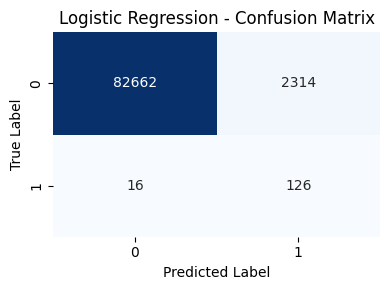

In [570]:
report_results("Logistic Regression",y_pred_logics,y_proba_logics,y_test)

1. **Precision is low**  
   Only about 5% of transactions flagged as fraud are actually fraud, indicating many false alarms.
2. **Recall is high:**  
   The model successfully detects approximately 89% of all fraud cases, missing only 16 out of 142.
3. **ROC AUC is excellent:**  
   A value of 0.97 shows strong overall ability to distinguish between fraudulent and legitimate transactions.


#### Random Forest:


Random Forest Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     84976
           1       0.96      0.72      0.82       142

    accuracy                           1.00     85118
   macro avg       0.98      0.86      0.91     85118
weighted avg       1.00      1.00      1.00     85118

ROC AUC: 0.9315


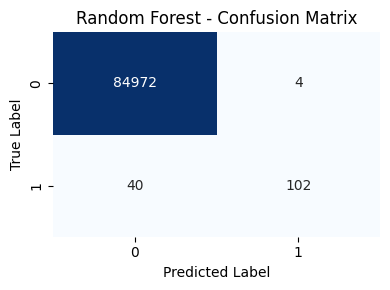

In [571]:
report_results("Random Forest",y_pred_rf,y_proba_rf,y_test)

1. **Precision is high:**  
   Approximately 96% of transactions flagged as fraud are actually fraud, indicating a very low false positive rate.
2. **Recall is moderate:**  
   The model successfully detects around 72% of all fraud cases.
3. **ROC AUC is excellent:**  
   A score of 0.93 demonstrates strong overall ability to distinguish between fraudulent and legitimate transactions.


#### Adaboost:


Adaboost Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     84976
           1       0.77      0.64      0.70       142

    accuracy                           1.00     85118
   macro avg       0.89      0.82      0.85     85118
weighted avg       1.00      1.00      1.00     85118

ROC AUC: 0.9649


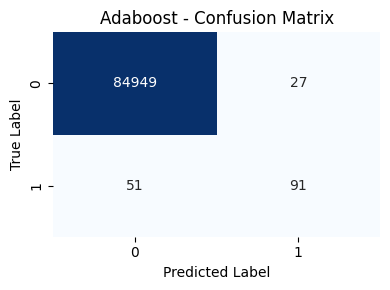

In [572]:
report_results("Adaboost",y_pred_ada,y_proba_ada,y_test)

1. Excellent precision on frauds (**0.77**), meaning most flagged frauds truly are frauds.
2. Recall on frauds is **0.64**, indicating it still misses some fraudulent cases.
3. Overall very high macro average (**0.89 precision, 0.82 recall, 0.85 F1**).

#### XGBoost:


XGBoost Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     84976
           1       0.90      0.75      0.82       142

    accuracy                           1.00     85118
   macro avg       0.95      0.88      0.91     85118
weighted avg       1.00      1.00      1.00     85118

ROC AUC: 0.9695


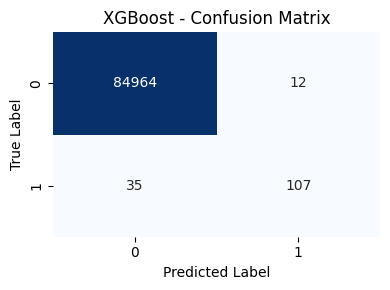

In [573]:
report_results("XGBoost",y_pred_xg,y_proba_xg,y_test)

1. Outstanding fraud precision (**0.90**) — almost every transaction flagged as fraud truly is.
2. Recall on frauds is **0.75**, higher than AdaBoost, catching more actual fraud cases.
3. Macro average also strong (**0.96 precision, 0.88 recall, 0.91 F1**), showing XGBoost handles this imbalanced problem extremely well.


### Explainability

#### Feature importance 

In [574]:
def plot_rf_importances(model, X_train, top_n=10):
    importances = pd.Series(model.feature_importances_, index=X_train.columns)
    top_importances = importances.sort_values(ascending=False).head(top_n)
    
    plt.figure(figsize=(6, 4))
    top_importances.plot(kind='barh', color='skyblue')
    plt.xlabel("Feature Importance")
    plt.title(f"Top {top_n} Important Features (Random Forest)")
    plt.gca().invert_yaxis()  # Highest importance on top
    plt.tight_layout()
    plt.show()
    return top_importances

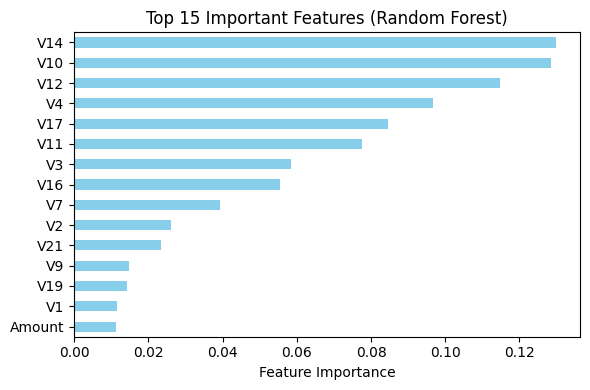

In [575]:
top_importances = plot_rf_importances(rf,X_train,top_n=15)

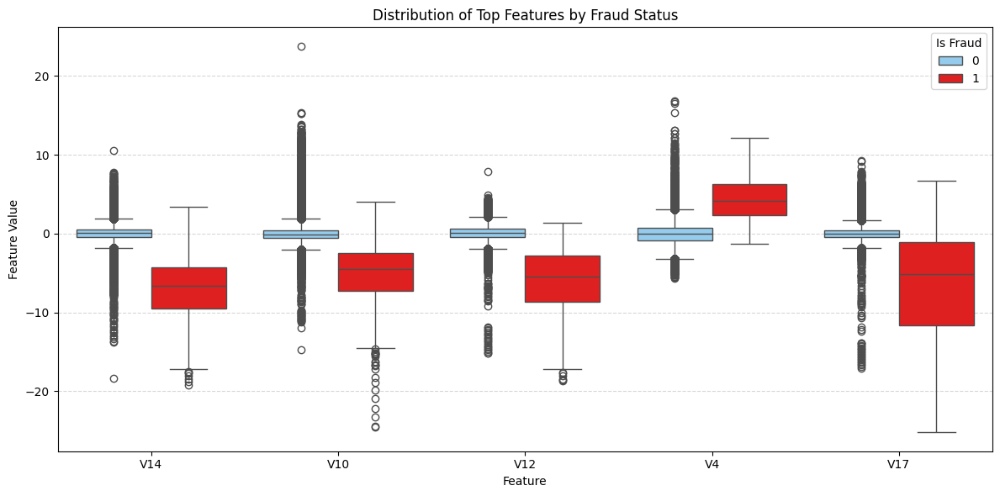

In [576]:
df_melted = df.melt(id_vars='IsFraud', value_vars=top_importances.index[:5],
                    var_name='Feature', value_name='Value')

plt.figure(figsize=(12,6))
sns.boxplot(x='Feature', y='Value', hue='IsFraud', data=df_melted,
            palette={0: 'lightskyblue', 1: 'red'})

plt.title("Distribution of Top Features by Fraud Status")
plt.ylabel("Feature Value")
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(title="Is Fraud")
plt.tight_layout()
plt.show()


1. Our unsupervised anomaly detection in 1-D highlighted features like `V27`, `V20`, and `V8` due to extreme outlier behavior in fraud transactions.  
2. In contrast, the Random Forest identified features such as `V14`, `V10`, and `V12` as most important because they consistently reduced class impurity across many splits. This reflects the difference between purely statistical anomaly detection and supervised learning focused on class separation.


#### LIME (Local Interpretable Model-agnostic Explanations)
Explains individual predictions by approximating the complex model with a simple, interpretable surrogate (like a linear model) around that specific data point, showing which features most influenced the decision.


In [579]:
explainer = LimeTabularExplainer(
    training_data = np.array(X_train),
    feature_names = X_train.columns,
    class_names = ['Non-Fraud', 'Fraud'],
    mode='classification'
)


In [580]:
def run_lime(index,model):
    exp = explainer.explain_instance(
        data_row = X_test.iloc[index],
        predict_fn = lambda x: model.predict_proba(pd.DataFrame(x, columns=X_test.columns))
    )
    exp.show_in_notebook(show_table=True)

##### Lime on false positive Logistic regression:

In [585]:
lg_tp = np.where((lg.predict(X_test) == 1) & (y_test == 0))[0]
idx_lg_tp = np.random.choice(lg_tp, 3, replace=False)
for idx in idx_lg_tp:
    run_lime(idx,lg)

- Logistic Regression’s low precision (5%) is reflected in LIME results, where false positives were driven by features like RiskSegment, V2, V8, and Amount—suggesting the model incorrectly flagged benign patterns as fraudulent. This highlights poor feature discrimination in some value ranges.

##### Lime on true positive Random forest:

In [586]:
rf_tp = np.where((rf.predict(X_test) == 1) & (y_test == 1))[0]
idx_rf_tp = np.random.choice(rf_tp, 3, replace=False)
for idx in idx_rf_tp:
    run_lime(idx,rf)

- LIME highlights `V14`, `V4`, and `V12` as top drivers in individual fraud predictions, matching their global importance in Random Forest, showing they reliably separate fraud from normal transactions.

##### Lime on false negative Random forest:

In [587]:
rf_fn = np.where((rf.predict(X_test) == 0) & (y_test == 1))[0]
idx_rf_fn = np.random.choice(rf_fn, 3, replace=False)
for idx in idx_rf_fn:
    run_lime(idx,rf)

- Random forest got 70% recall, meaning 30% false negative.
- Examining false negatives with LIME reveals that even when `V14`,`V12` and `V11` retains strong influence, other features like `V3`, `V17`, or `V9` can offset the fraud signal, resulting in predictions of Not Fraud.

#### Shap
SHAP quantifies feature importance by measuring how the prediction changes when each feature is “removed” or varied across different combinations. If the prediction declines without it, the feature is deemed critical to the model’s decision.


In [588]:
def run_shap(idx):
    shap.plots._waterfall.waterfall_legacy(
        explainer.expected_value[1],
        shap_values[idx, :, 1],
        sample_X_test.iloc[idx]
    )

In [589]:
sample_X_test = X_test.sample(2000, random_state=42)
sample_idx = sample_X_test.index 
sample_y_test = y_test.loc[sample_idx]

##### Shap summary plot Random forest:

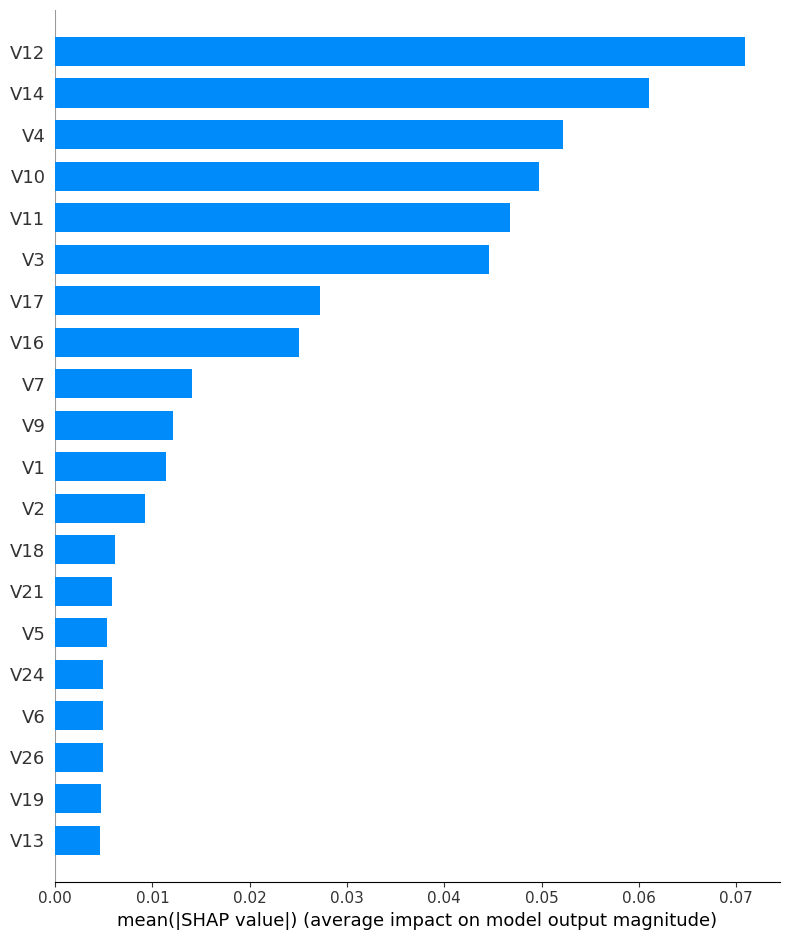

In [590]:
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(sample_X_test)
shap.summary_plot(shap_values[:, :, 1], sample_X_test, plot_type="bar")

- The SHAP summary plot highlights that `V12`, `V14`, and `V4` consistently emerge as the top features influencing fraud predictions. This aligns with patterns observed earlier in our Random Forest feature importances and local LIME explanations, reinforcing their critical role in distinguishing fraudulent transactions.


##### Shap on false negative Random forest:

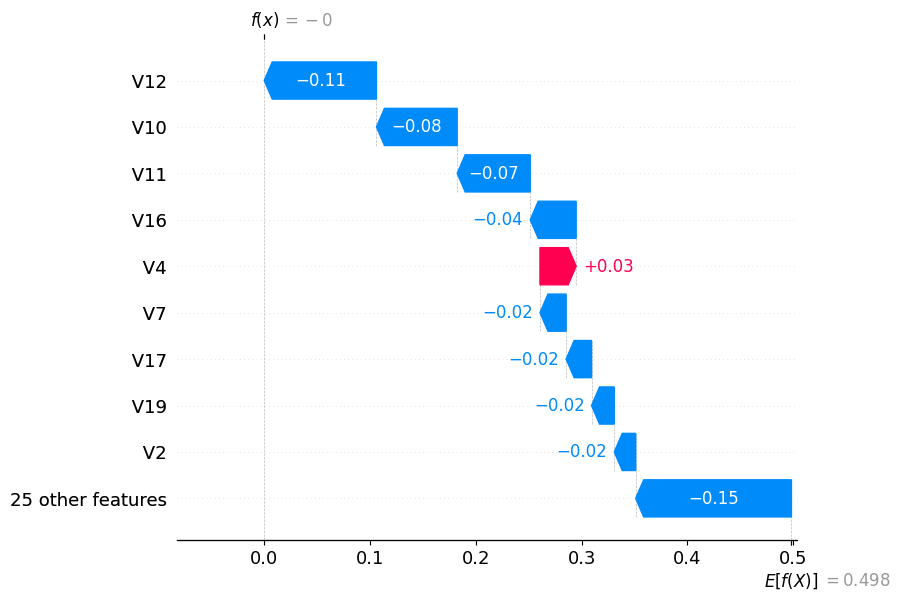

In [591]:
rf_preds_sample = rf.predict(sample_X_test)
rf_fn_sample = np.where((rf_preds_sample == 0) & (sample_y_test == 1))[0]
run_shap(rf_fn_sample[0])

- This false negative occurred because values of key features like `V12`, `V11`, and `V10` made the transaction resemble normal behavior, despite it being fraud.

## Report
---

### Model Performance Summary


| Model                | Fraud Precision | Fraud Recall | Fraud F1 | ROC AUC |
|-----------------------|-----------------|-------------|----------|---------|
| Logistic Regression   | **0.05**        | **0.89**    | 0.10     | 0.9702  |
| Random Forest         | **0.96**        | 0.70        | 0.81     | 0.9420  |
| AdaBoost              | 0.77            | 0.64        | 0.70     | 0.9649  |
| XGBoost               | 0.91            | 0.75        | 0.82     | 0.9736  |


- <u>Best precision</u>: Random Forest (**0.96**)  
  Out of all transactions it flagged as fraud, **96% were truly frauds**, minimizing false positives.

- <u>Best recall</u>: Logistic Regression (**0.89**)  
  It captured **89% of all actual frauds**, but with very low precision (**5%**), leading to many false positives.

- <u>Best balance</u>: XGBoost  
  Achieved both **high precision (0.91)** and **high recall (0.75)**, resulting in the strongest overall fraud F1 and the highest ROC AUC (**0.9736**).


#### Trade-off:
This reflects a typical trade-off in fraud detection systems:  
- **High recall models** are used when it’s critical not to miss fraud.\
We detect most fraud cases, but also flag many legitimate transactions by mistake (more false positives), so more manual reviews or customer verifications are required.
- **High precision models** are preferred when minimizing disruption to legitimate customers is more important.\
Almost everything we flag truly is fraud (few false positives), but we allow more frauds to slip through undetected.

### Conclusions

Here's your refined and complete conclusion with all requested changes applied:

---

### Conclusion

1. If minimizing false alarms is most critical, **Random Forest** is ideal.
2. If finding nearly all frauds matters more (even with many false alarms), **Logistic Regression** is better.
3. **XGBoost** provides the best overall tradeoff, maintaining both strong precision and recall.
4. From 1-D anomaly detection across all methods (**STD, IQR, MAD**), anomalies in `V27`, `V20`, and `V8` consistently showed higher fraud rates. Using Mahalanobis Distance Ellipse, the pair `V27` + `V20` further demonstrated their strength by isolating anomalies with a fraud rate **8.6× higher** than the dataset average.
5. Similarly, Mahalanobis analysis on `V14` + `V12` revealed an even stronger anomaly pattern, with flagged transactions being **12× more likely** to be fraud, underscoring the power of these features to capture atypical, high-risk behaviors.
6. The combined `RiskSegment` feature analysis showed that fraud is most concentrated in segments like **`early_4am_low_amount` (4.1%)** and **`night_peak_2am_low_amount` (3.2%)**. This suggests that fraudsters frequently perform small transactions during unusual hours—likely to test stolen cards or exploit off-hour monitoring gaps. However, this feature did **not** rank as globally important and even contributed to **false negatives** in SHAP analysis, revealing limitations in how global models interpret engineered features.
7. Top direct correlations with fraud were observed for `V11` and `V4`, indicating these features individually align most strongly with fraudulent behavior in the dataset.
8. The **Random Forest** model identified `V14`, `V10`, `V12`, and `V4` as key global features for fraud detection. **SHAP** and **LIME** analyses confirmed these as top drivers, reinforcing their crucial role in distinguishing fraudulent transactions.
9. However, **SHAP** analysis on false negatives revealed that these same features sometimes pushed predictions toward **Not Fraud**, causing misses when fraud cases resembled typical normal patterns.
10. **LIME** analysis similarly showed that in false negatives, `V12` and `V4` consistently pushed predictions toward fraud, while `V14` occasionally misled the model toward **Not Fraud**, explaining gaps between global importance and local decision errors. In false positives from **Logistic Regression**, features like `V2`, `V8`, `Amount`, and even the engineered `RiskSegment` misled the model into predicting fraud where there was none, likely contributing to its low **5% precision**.

## Improve
---


### Running Random forest with important features from SHAP:

Running RandomForestClassifier(class_weight='balanced', n_jobs=-1, random_state=42)...

Random Forest Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     84976
           1       0.94      0.73      0.82       142

    accuracy                           1.00     85118
   macro avg       0.97      0.86      0.91     85118
weighted avg       1.00      1.00      1.00     85118

ROC AUC: 0.9105


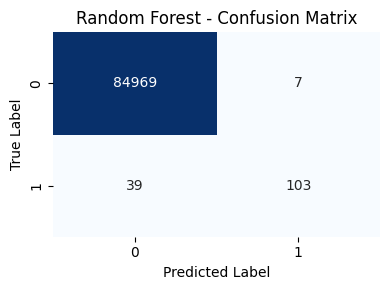

In [592]:
top_features = ['V12', 'V14', 'V4', 'V3', 'V10', 'V11']

X_train_reduced = X_train[top_features]
X_test_reduced = X_test[top_features]

_, y_pred_reduced, y_proba_reduced = run_model("Random Forest", X_train_reduced, X_test_reduced, y_train)
report_results("Random Forest",y_pred_reduced,y_proba_reduced,y_test)


- Reducing to the top SHAP features led to a slight gain in recall (from 72% → 73%), with only a small drop in precision and AUC.
This shows that a simplified model using just 6 key features can still capture nearly all fraud cases with high precision, making it more interpretable and efficient — an excellent trade-off for real-world deployment scenarios.


### Balance using SMOTE:

In [593]:
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)
print("Original:", y_train.value_counts())
print()
print("Resampled:", y_train_balanced.value_counts())

Original: IsFraud
0    198277
1       331
Name: count, dtype: int64

Resampled: IsFraud
0    198277
1    198277
Name: count, dtype: int64


Running LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)...

Logistic Regression Results:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     84976
           1       0.13      0.87      0.23       142

    accuracy                           0.99     85118
   macro avg       0.57      0.93      0.61     85118
weighted avg       1.00      0.99      0.99     85118

ROC AUC: 0.9697


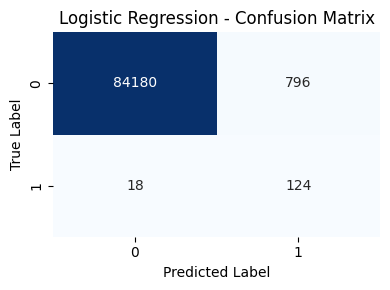



Running RandomForestClassifier(class_weight='balanced', n_jobs=-1, random_state=42)...

Random Forest Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     84976
           1       0.91      0.79      0.85       142

    accuracy                           1.00     85118
   macro avg       0.96      0.89      0.92     85118
weighted avg       1.00      1.00      1.00     85118

ROC AUC: 0.9583


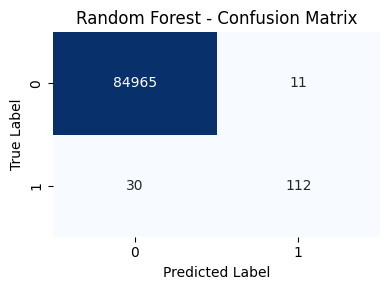



Running AdaBoostClassifier(algorithm='SAMME', n_estimators=100, random_state=42)...

Ada Boost Results:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     84976
           1       0.13      0.86      0.22       142

    accuracy                           0.99     85118
   macro avg       0.56      0.92      0.61     85118
weighted avg       1.00      0.99      0.99     85118

ROC AUC: 0.9641


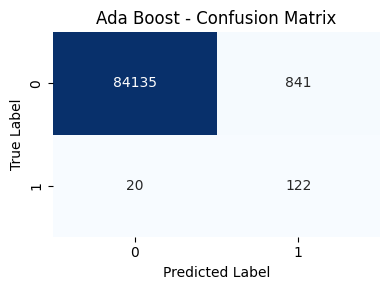



Running XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)...

XGBoost Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     84976
           1       0.88      0.80      0.83       142

    accuracy             

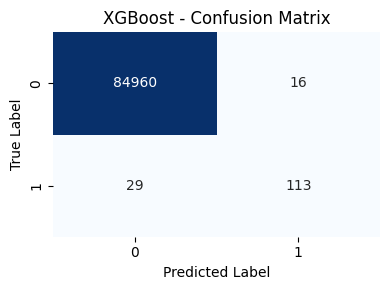

In [594]:
for model_name in ["Logistic Regression", "Random Forest", "Ada Boost", "XGBoost"]:
    model, y_pred, y_proba = run_model(model_name, X_train_balanced, X_test, y_train_balanced)
    report_results(model_name,y_pred,y_proba,y_test)
    print("\n")


| Model                | Fraud Precision (Before → After SMOTE) | Fraud Recall (Before → After SMOTE) |
|-----------------------|---------------------------------------|-------------------------------------|
| Logistic Regression   | **0.05 → 0.13**                       | 0.89 → 0.87                     |
| Random Forest         | 0.96 → 0.91                       | **0.72 → 0.79**                     |
| AdaBoost              | 0.77 → 0.13                       | **0.64 → 0.86**                     |
| XGBoost               | 0.90 → 0.88                       | **0.75 → 0.80**                     |

- **Logistic Regression:**  
  Fraud precision improved from **5% to 13%**, showing it better identified fraud after balancing. Recall stayed high, slightly decreasing from **0.89 to 0.87**.

- **Random Forest:**  
  Recall increased from **0.72 to 0.79**, catching more frauds. Precision dropped slightly from **0.96 to 0.91**, still very strong.

- **AdaBoost:**  
  Fraud recall rose significantly from **0.64 to 0.86**, but precision dropped sharply from **0.77 to 0.13**, indicating more frauds were caught at the cost of many false positives.

- **XGBoost:**  
  Saw a small improvement in recall (**0.75 → 0.80**), with a slight drop in precision (**0.90 → 0.88**), reflecting its robustness due to built-in `scale_pos_weight`.

**Conclusion:**  
SMOTE particularly helped Logistic Regression and Random Forest by exposing them to more fraud examples, boosting recall. AdaBoost became much more sensitive but at the cost of precision, while XGBoost showed modest improvements, confirming it already handled imbalance well.
